In [14]:
import glob
import itertools
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import os
import pandas as pd
import pickle
import re
import scanpy as sc
import scipy
import seaborn as sns
#import signatureanalyzer as sa
import sklearn
import statsmodels
import sys
import scikit_posthocs as sp


from adjustText import adjust_text
import matplotlib.gridspec as grid_spec
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.neighbors import KernelDensity
from statsmodels.stats.multicomp import pairwise_tukeyhsd

#local import
import helper_functions

In [308]:
sc.settings.verbosity = 0            # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white', format='png')#, figsize=[10,10])
fig_dir = 'figures/script5/'
sc.settings.figdir = fig_dir
if not os.path.exists(fig_dir):
    os.mkdir(fig_dir)

In [3]:
sc.logging.print_header()

scanpy==1.7.1 anndata==0.7.5 umap==0.5.1 numpy==1.19.5 scipy==1.5.3 pandas==1.1.5 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.8.3 leidenalg==0.8.3


# Read in QCd/cleaned CD138+ anndata object

In [3]:
adata_location = 'outputs/script3.5/cd138_adata_postQC_groundtruthlabeled_leidenresults.h5ad' #replace with your local path to anndata object

In [5]:
cd138_adata = sc.read(adata_location)
cd138_adata

AnnData object with n_obs × n_vars = 29387 × 22273
    obs: 'person', 'age', 'sorting_tag', 'disease_stage', 'sex', 'disease_stage_short', 'SAMPLE', 'sample_id', 'Type', 'Gender', 'Age at Dx', 'Diagnosis date', 'Race', 'Type.1', 'FISH 1', 'FISH 1 Date', 'FISH 2', 'FISH 2 Date', 'FISH 3', 'FISH 3 Date', 'FISH 4', 'FISH 4 Date', 'BM at Diagnosis', 'M Protein when sample was taken', 'Date of BM Aspirate used for single-cell RNA Seq', 'Infiltration of Used BM or Aspirate', 'BM Transplant', 'Transplant Date', 'Induction', 'XRT', 'Maintenance Tx', 'Relapse Date', 'Total # cells', 'CD138+', 'CD45+', 'CD45-', 'PMH', 'Family Hx', 'Smoking', 'Alcohol', 'Previous Chemo', 'n_genes', 'percent_mito', 'n_counts', 'possible_doublet', 'S_score', 'G2M_score', 'phase', 'prolif_idx', 'EMT_score', 'leiden', '__is_in_cluster__', 'ground_truth', 'ncells_persample', 'hemoglobin_score', 'person_group', 'sample_purity', 'person_oldnames', 'tx', 'HRD', 'driver event', 'driver_event_specific', 'batch', 'vial'
   

### add ages

In [157]:
print(cd138_adata.obs[cd138_adata.obs.disease_stage=="NBM"].age.min())
print(cd138_adata.obs[cd138_adata.obs.disease_stage=="NBM"].age.mean())
print(cd138_adata.obs[cd138_adata.obs.disease_stage=="NBM"].age.max())
print("\n")
print(cd138_adata.obs[cd138_adata.obs.disease_stage!="NBM"].age.min())
print(cd138_adata.obs[cd138_adata.obs.disease_stage!="NBM"].age.mean())
print(cd138_adata.obs[cd138_adata.obs.disease_stage!="NBM"].age.max())

30.0
44.104605960654965
66.0


48.0
60.92471831688105
81.0


### set categorical order in person and disease_stage

### add driver event (matches Fig 1f)

### add batch information

In [303]:
cd138_adata.obs.batch = cd138_adata.obs.batch.map({'Dec':'batch 4', 'Feb':'batch 5', 'May':'batch 6', 'Nov':'batch 3', 'Oct':'batch 2', 'Sept':'batch 1'})

### write umi counts, obs, and var to files

In [10]:
cd138_adata.obs['group'] = cd138_adata.obs.disease_stage.astype(str) + ' ' + cd138_adata.obs.ground_truth.astype(str)
cd138_adata.obs['person_split'] = cd138_adata.obs.person.astype(str) + ' ' + cd138_adata.obs.ground_truth.astype(str)

In [162]:
# add subclone ID for SMM-12
person_adata = cd138_adata[cd138_adata.obs.person.isin(["SMM-12"]),:].copy()
person_adata.obs.rename(columns={'leiden':'leiden_orig'}, inplace=True)
sc.pp.highly_variable_genes(person_adata, layer="lognorm", min_mean=0.0125, max_mean=3, min_disp=0.6)
person_adata.var.highly_variable.loc[np.intersect1d(ig_genes, cd138_adata.var.index)] = False
sc.pp.scale(person_adata, max_value=10)
sc.tl.pca(person_adata, svd_solver='arpack')

/opt/conda/rpeyser/envs/mm_singlecell_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/opt/conda/rpeyser/envs/mm_singlecell_v2/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:752: RuntimeWarning: invalid value encountered in sqrt
  std = np.sqrt(var)


In [163]:
pcs_to_keep = 6
### Computing the neighborhood graph & embedding in UMAP plot

sc.pp.neighbors(person_adata, n_neighbors=10, n_pcs=pcs_to_keep)

sc.tl.umap(person_adata)

sc.tl.leiden(person_adata, resolution = 0.3)

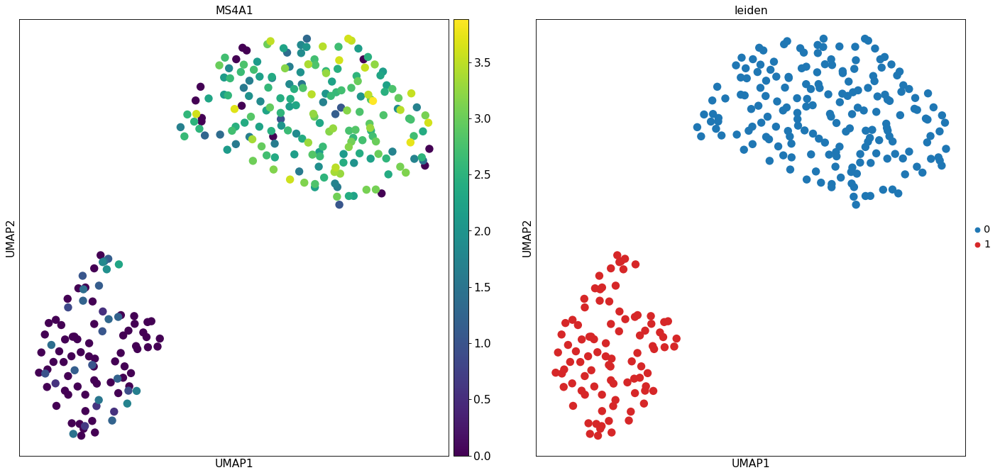

In [167]:
sc.pl.umap(person_adata, color=["MS4A1","leiden"])

In [177]:
cd138_adata.obs['SMM_12_subcluster'] = None

In [178]:
cd138_adata.obs.loc[person_adata.obs[person_adata.obs.leiden=="0"].index, 'SMM_12_subcluster'] = 'CD20+'
cd138_adata.obs.loc[person_adata.obs[person_adata.obs.leiden=="1"].index, 'SMM_12_subcluster'] = 'CD20-'

In [180]:
#change healthy plasma to normal (lmer cant handle space)
obs_towrite = cd138_adata.obs.copy()
obs_towrite.ground_truth.cat.add_categories("normal", inplace=True)
obs_towrite.loc[obs_towrite.ground_truth=="healthy plasma","ground_truth"]="normal"
obs_towrite.ground_truth.cat.remove_unused_categories(inplace=True)

In [181]:
obs_towrite.to_csv("outputs/cd138_adata_obs.csv")

In [9]:
cd138_adata.var.to_csv("outputs/cd138_adata_var.csv")

# define some gene sets

In [161]:
# IG genes or genes on IG locus (object made in script 4b), which are variable because of known disease type and separate patients from each other
ig_genes = list(pd.read_csv("data/ig_locus_genes.txt", header=None).iloc[:,0]) #this is what i should do in future but used regex matching at time of this script. only left in 3 too many HVG

# hemoglobin genes -- likely contamination
r = re.compile("^HB.*")
hemoglobin_genes = list(filter(r.match, cd138_adata.var.index))
#by manual inspection, not all of these are hemoglobin genes, remove those
hemoglobin_genes.remove("HBEGF")
hemoglobin_genes.remove("HBS1L")
hemoglobin_genes.remove("HBP1")

# ribosomal proteins
r = re.compile("^RP.*")
rp_genes = list(filter(r.match, cd138_adata.var.index))

#sex genes
sex_genes = ['XIST', 'RPS4Y1']

#immune genes
immune_genes = ['PTPRC', 'LILRA4', 'CD14', 'FCER1A', 'MPO', 'CD34', 'CD3D', 'KLRC1','FCGR3A', 'CD1C','IGLL1', 'MS4A1', 'CD68', 'IL7R', 'NKG7', 'LYZ']
lightchain_genes = ['IGKC', 'IGLC2', 'IGLC7']
heavychain_genes = ['IGHG4','IGHG2','IGHGP','IGHG1','IGHG3','IGHA1','IGHA2','IGHE','IGHM','IGHD']

# define colors per disease stage and patient for plotting heatmaps of cells later

In [18]:
#load list of colors
from matplotlib import colors as mcolors
colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)
# Sort colors by hue, saturation, value and name.
by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgba(color)[:3])), name)
                for name, color in colors.items())
sorted_names = [name for hsv, name in by_hsv]

mycolors = cd138_adata.obs[['person', 'disease_stage']]

#get row colors for heatmap at evenly spaced intervals
color_inds = np.linspace(0, len(sorted_names)-1, len(np.array(cd138_adata.obs['person'].cat.categories)))
color_inds = np.around(color_inds).astype('int')
mycolors['person_orig'] = mycolors['person']
mycolors['person'] = cd138_adata.obs['person'].map(dict(zip(np.array(cd138_adata.obs['person'].cat.categories), np.array(sorted_names)[color_inds])))

color_inds = np.linspace(0, len(sorted_names)-1, len(np.array(cd138_adata.obs['disease_stage'].cat.categories)))
color_inds = np.around(color_inds).astype('int')
mycolors['disease_stage_orig'] = mycolors['disease_stage']
mycolors['disease_stage'] = cd138_adata.obs['disease_stage'].map(dict(zip(np.array(cd138_adata.obs['disease_stage'].cat.categories), np.array(sorted_names)[color_inds])))

#add legends for annotating color bars (currently cant figure out how to format them both on the figure, so only printing one)
legend_TN_ds = [mpatches.Patch(color=c, label=l) for c,l in mycolors[['disease_stage','disease_stage_orig']].drop_duplicates().values]
legend_TN_p = [mpatches.Patch(color=c, label=l) for c,l in mycolors[['person','person_orig']].drop_duplicates().values]

/opt/conda/rpeyser/envs/mm_singlecell_v2/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/rpeyser/envs/mm_singlecell_v2/lib/python3.6/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/opt/conda/rpeyser/envs/mm_singlecell_v2/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

In [19]:
#for when index is person name

#load list of colors
from matplotlib import colors as mcolors
colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)
# Sort colors by hue, saturation, value and name.
by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgba(color)[:3])), name)
                for name, color in colors.items())
sorted_names = [name for hsv, name in by_hsv]

mycolors_personbased = cd138_adata.obs[['person', 'disease_stage']].set_index('person', drop=False).drop_duplicates()

#get row colors for heatmap at evenly spaced intervals
color_inds = np.linspace(0, len(sorted_names)-1, len(np.array(cd138_adata.obs['person'].cat.categories)))
color_inds = np.around(color_inds).astype('int')
mycolors_personbased['person_orig'] = mycolors_personbased['person'].copy()
mycolors_personbased['person'] = mycolors_personbased['person'].map(dict(zip(np.array(mycolors_personbased['person'].cat.categories), np.array(sorted_names)[color_inds])))

color_inds = np.linspace(0, len(sorted_names)-1, len(np.array(cd138_adata.obs['disease_stage'].cat.categories)))
color_inds = np.around(color_inds).astype('int')
mycolors_personbased['disease_stage_orig'] = mycolors_personbased['disease_stage'].copy()
mycolors_personbased['disease_stage'] = mycolors_personbased['disease_stage'].map(dict(zip(np.array(mycolors_personbased['disease_stage'].cat.categories), np.array(sorted_names)[color_inds])))

#add legends for annotating color bars (currently cant figure out how to format them both on the figure, so only printing one)
legend_TN_ds_personbased = [mpatches.Patch(color=c, label=l) for c,l in mycolors[['disease_stage','disease_stage_orig']].drop_duplicates().values]
legend_TN_p_personbased = [mpatches.Patch(color=c, label=l) for c,l in mycolors[['person','person_orig']].drop_duplicates().values]

In [20]:
#bigger figure size for umap plots
sc.settings.set_figure_params(figsize=[6,6], dpi=150, format='png')

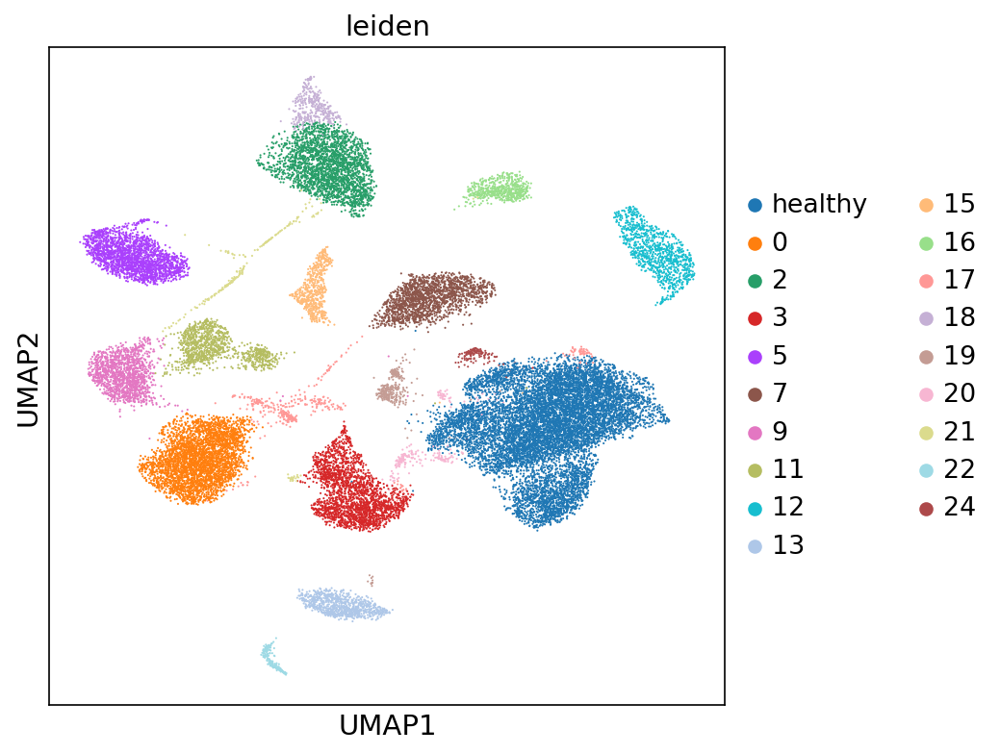

In [70]:
sc.pl.umap(cd138_adata, color="leiden")

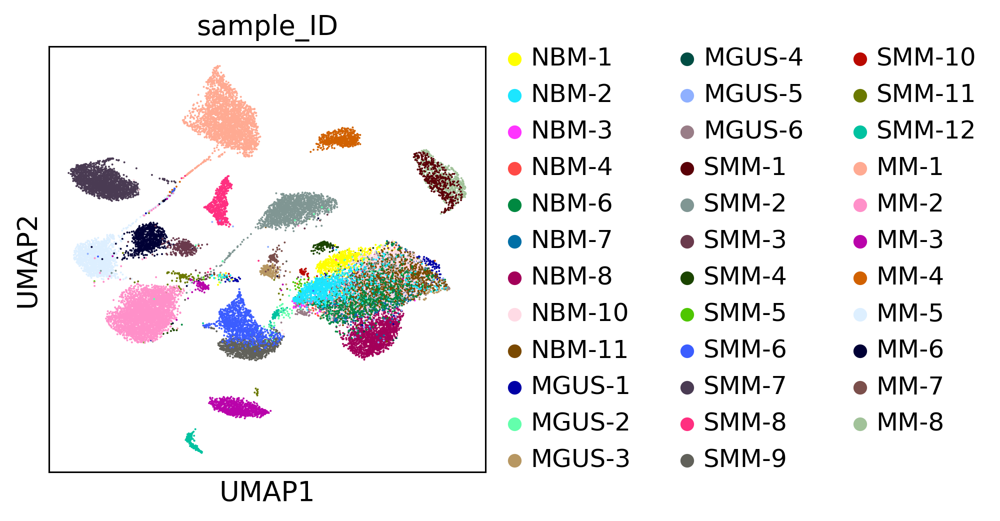

In [158]:
sc.pl.umap(cd138_adata, color="person", title="sample_ID", save="_patient.png")

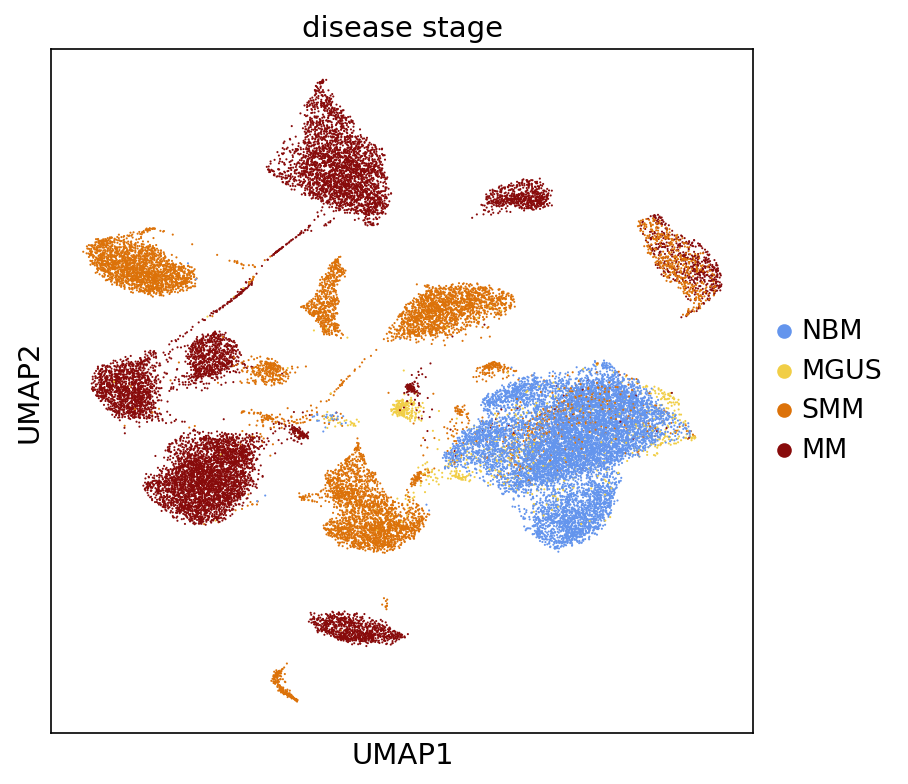

In [72]:
sc.pl.umap(cd138_adata, color="disease_stage", title="disease stage", save="_diseasestage.png")

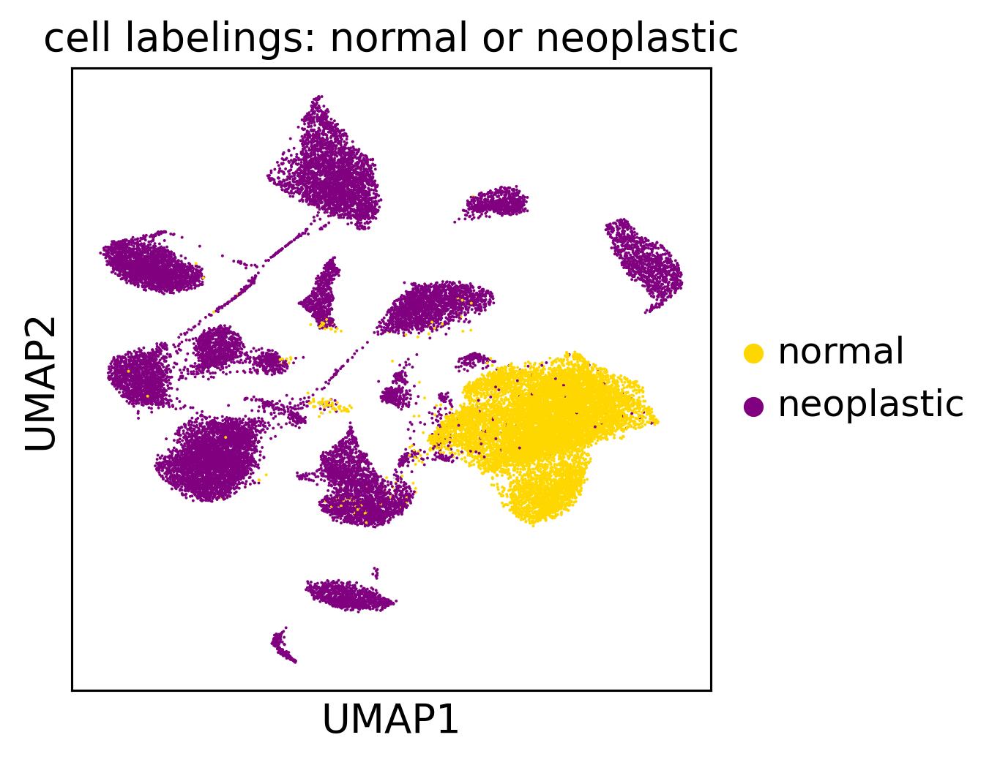

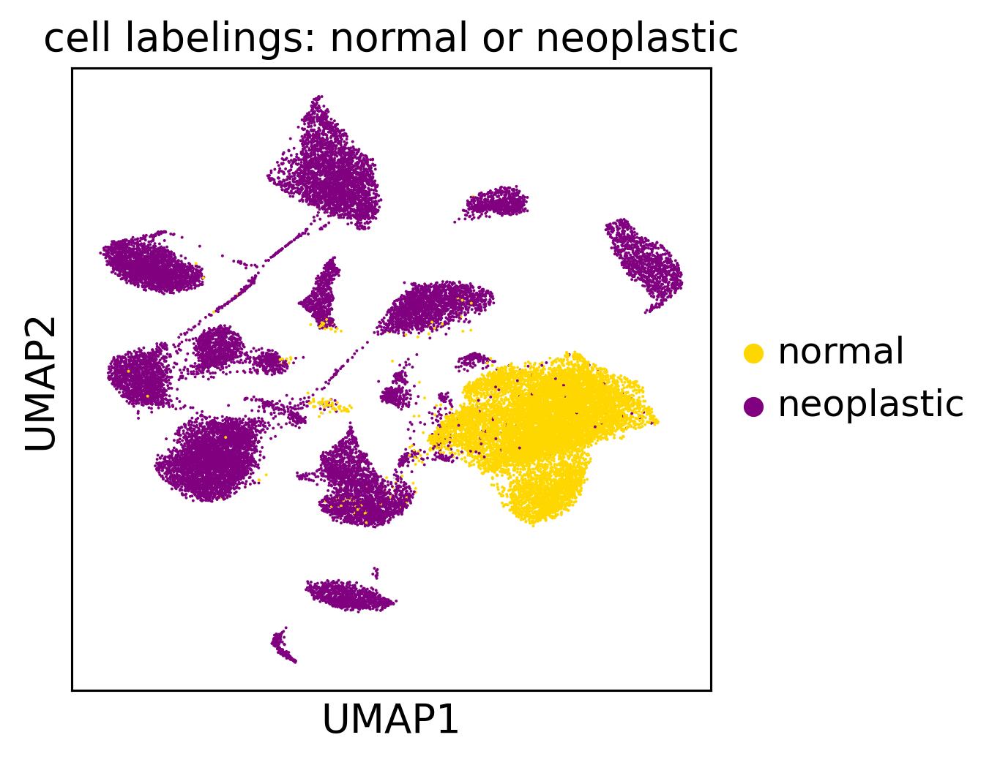

In [150]:
cd138_adata.obs.ground_truth.cat.rename_categories({'healthy plasma':'normal', 'malignant':'neoplastic'}, inplace=True)
sc.pl.umap(cd138_adata, color="ground_truth", na_in_legend=False, title="cell labelings: normal or neoplastic", save="_groundtruths.pdf")
sc.pl.umap(cd138_adata, color="ground_truth", na_in_legend=False, title="cell labelings: normal or neoplastic", save="_groundtruths.png")
cd138_adata.obs.ground_truth.cat.rename_categories({'normal':'healthy plasma', 'neoplastic':'malignant'}, inplace=True)

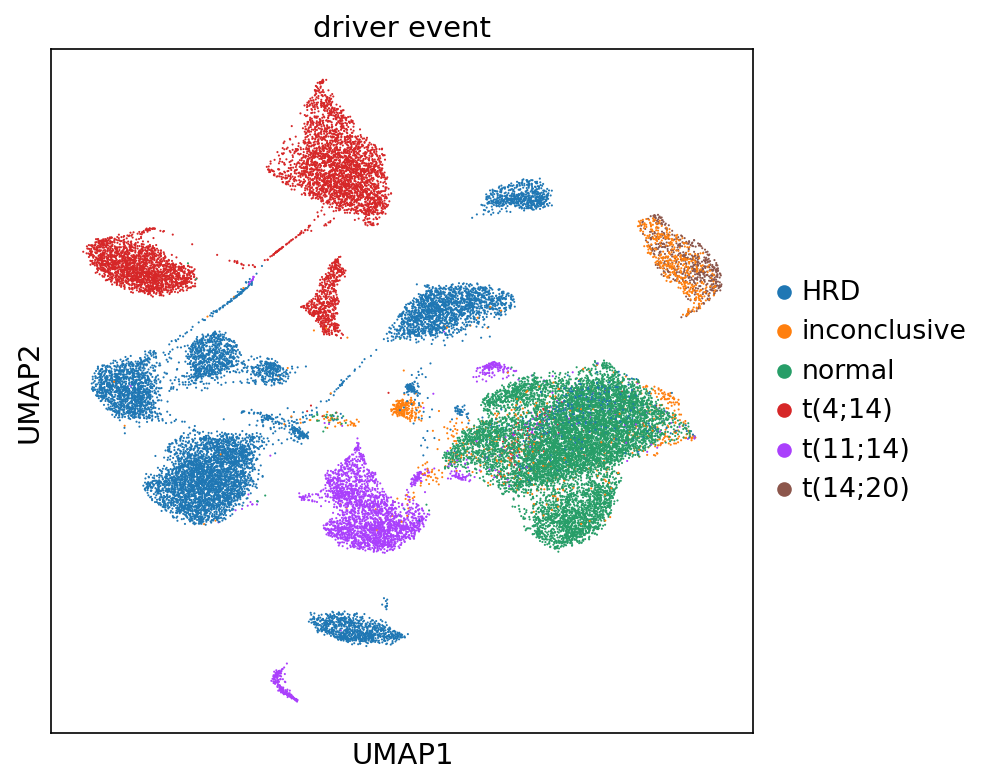

In [22]:
sc.pl.umap(cd138_adata, color="driver_event_specific", title="driver event", save="_driverevent.pdf")

In [334]:
cd138_adata.obs[['disease_stage','sex','person']].drop_duplicates()[['disease_stage','sex']].value_counts()

disease_stage  sex   
SMM            male      8
MM             male      6
NBM            male      6
SMM            female    4
MGUS           female    4
NBM            female    3
MM             female    2
MGUS           male      2
dtype: int64

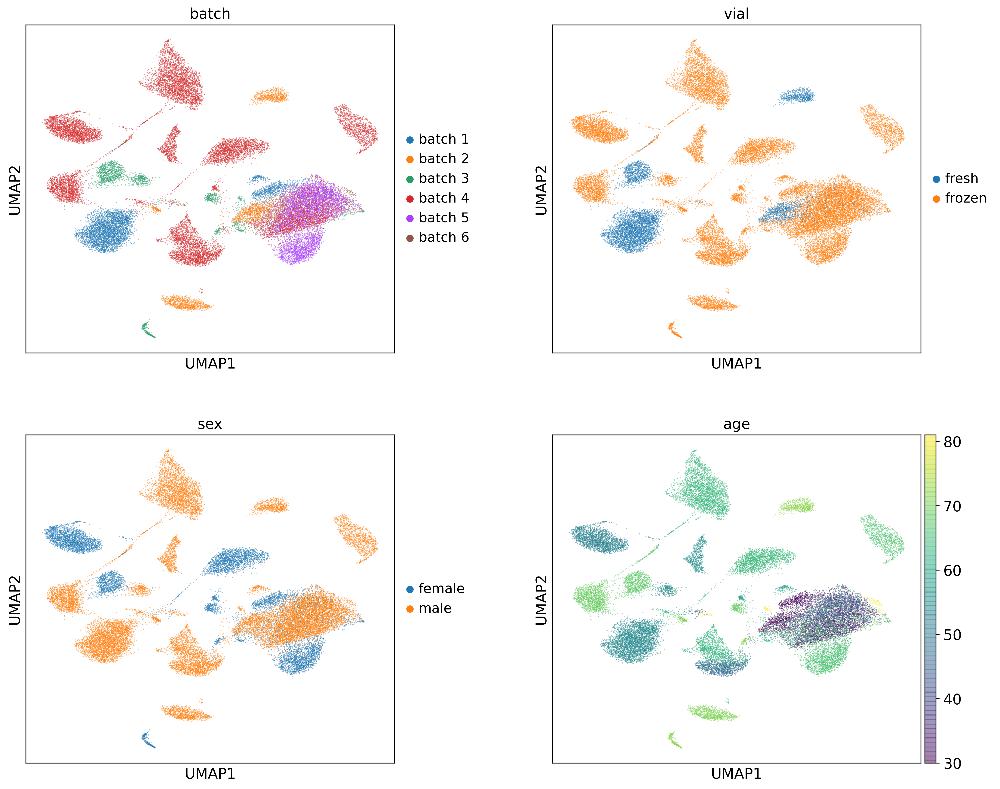

In [305]:
cd138_adata.obs.batch.cat.reorder_categories(['batch 1','batch 2','batch 3','batch 4','batch 5','batch 6'], ordered=True, inplace=True)
sc.settings.set_figure_params(dpi=400, facecolor='white', format='png', figsize=[6,6])
sc.pl.umap(cd138_adata, color=["batch","vial","sex","age"], save="_batch.png", alpha=0.5, ncols=2, wspace=0.3)

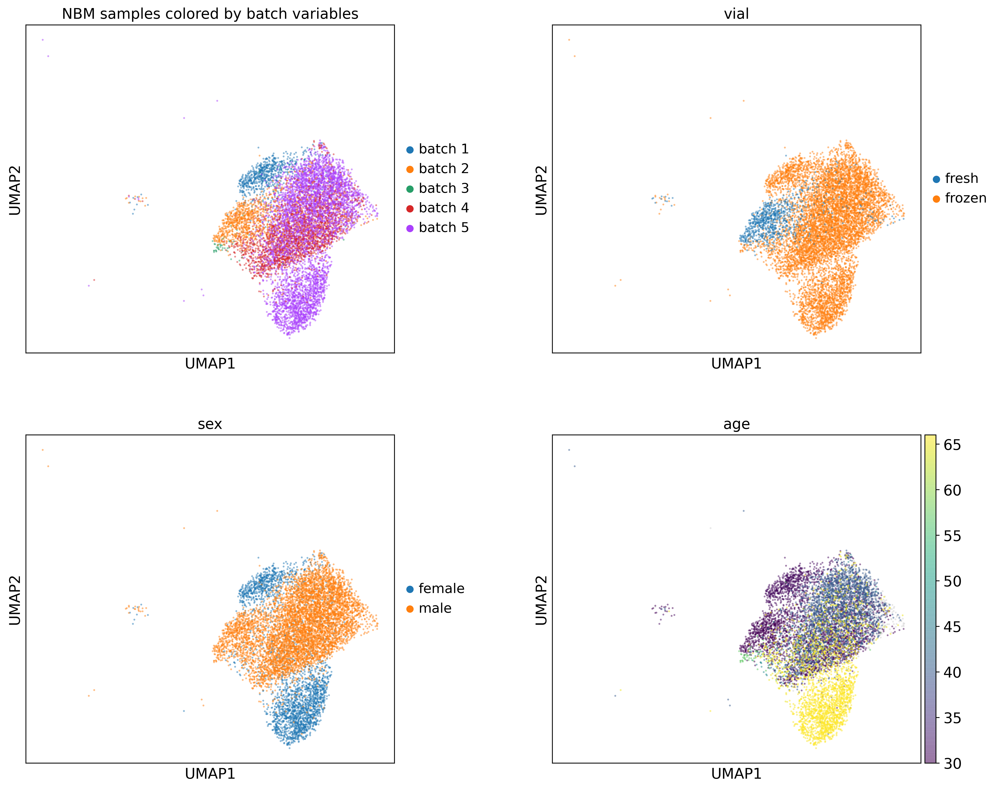

In [306]:
sc.pl.umap(cd138_adata[cd138_adata.obs.disease_stage=="NBM"], color=["batch","vial","sex","age"], title="NBM samples colored by batch variables", save="_batch_NBMonly.png", alpha=0.5, ncols=2, wspace=0.3)

# If limit to just cells labeled "healthy" are there still separations based on patient specific differences?

/opt/conda/rpeyser/envs/mm_singlecell_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


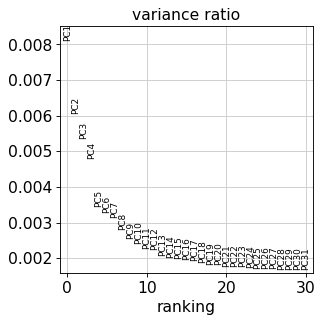

In [312]:
person_adata = cd138_adata[cd138_adata.obs.ground_truth=="healthy plasma",:].copy()
person_adata.obs['leiden_orig'] = person_adata.obs.leiden
sc.pp.highly_variable_genes(person_adata, layer="lognorm", min_mean=0.0125, max_mean=3, min_disp=0.6)
person_adata.var.highly_variable.loc[np.intersect1d(ig_genes,cd138_adata.var.index)] = False
sc.pp.scale(person_adata, max_value=10)
sc.tl.pca(person_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(person_adata)

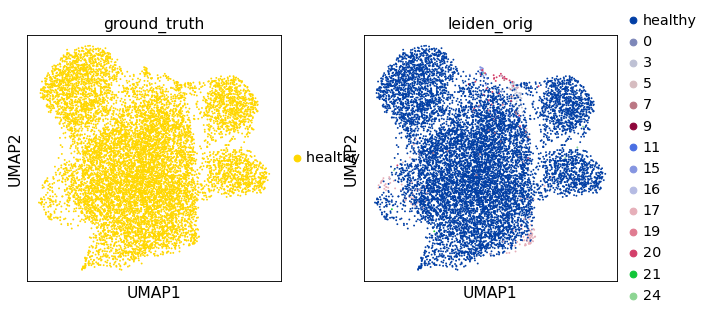

In [313]:
pcs_to_keep = 9

### Computing the neighborhood graph & embedding in UMAP plot

sc.pp.neighbors(person_adata,n_pcs=pcs_to_keep)

sc.tl.umap(person_adata)

sc.tl.leiden(person_adata)#, resolution = 0.6)
sc.pl.umap(person_adata, color=['ground_truth','leiden_orig'])

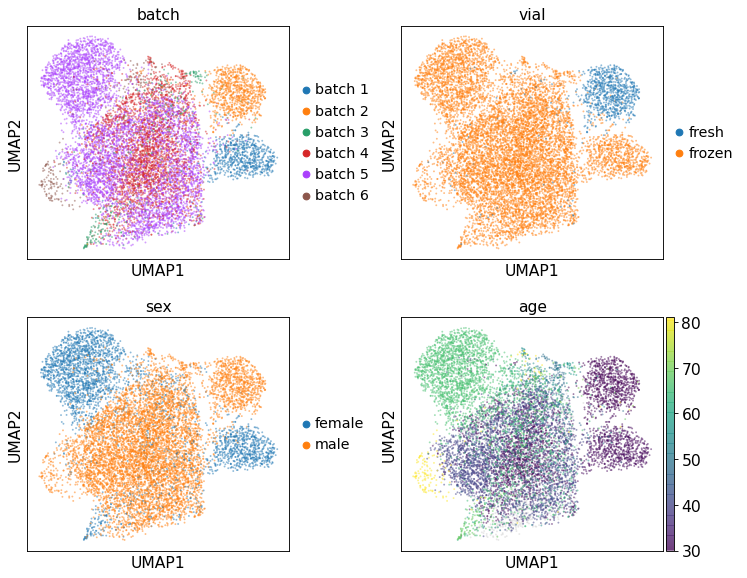

In [314]:
sc.pl.umap(person_adata, color=["batch","vial","sex","age"], save="_batch_NBMonly_reclustered.png", alpha=0.5, ncols=2, wspace=0.3)

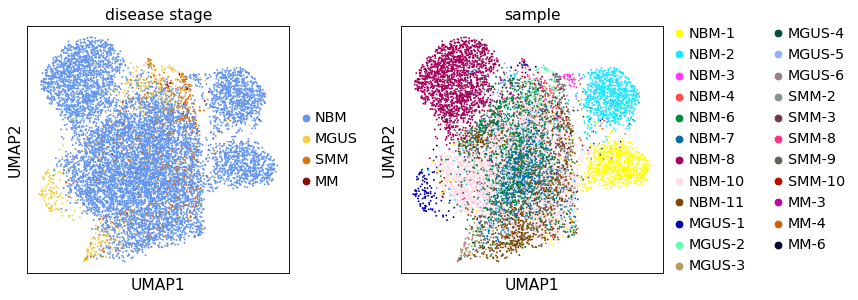

In [315]:
sc.pl.umap(person_adata, color=['disease_stage', 'person'], title=['disease stage','sample'], wspace=0.3, save="_suclustering_healthies.png")

# find HVG and run NMF

In [10]:
np.min(cd138_adata.X)

-10.344877

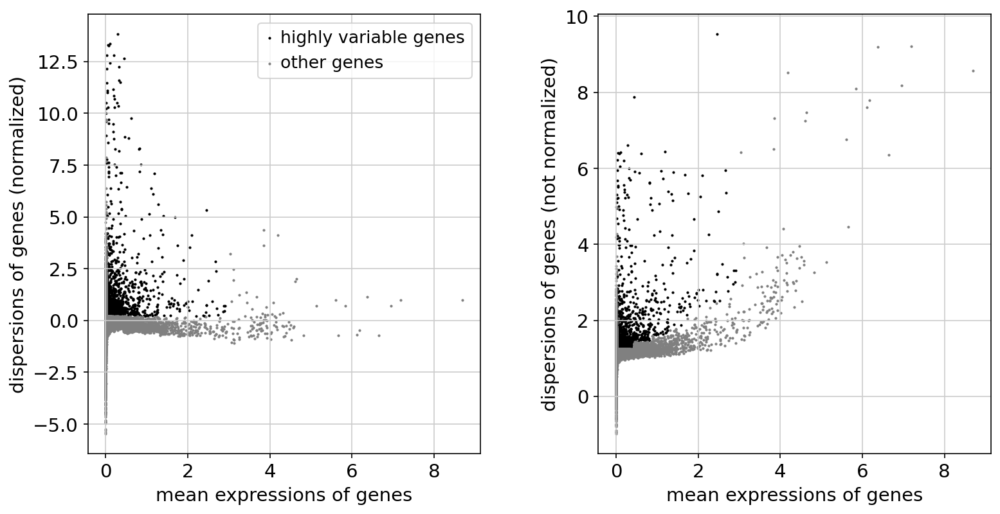

In [11]:
sc.pp.highly_variable_genes(cd138_adata, layer='lognorm', min_mean=0.0125, max_mean=3, min_disp=0.2)
sc.pl.highly_variable_genes(cd138_adata)

In [8]:
sc.settings.set_figure_params(dpi=80, facecolor='white', format='png')#, figsize=[7,7])

In [12]:
np.sum(cd138_adata.var.highly_variable)

3883

In [13]:
#remove immunoglobulins from highly variable list
cd138_adata.var.highly_variable[list(cd138_adata.var.index.intersection(ig_genes)) + hemoglobin_genes + sex_genes] = False
np.sum(cd138_adata.var.highly_variable)

/anaconda3/envs/mm_singlecell_v2/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/anaconda3/envs/mm_singlecell_v2/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


3751

# Run NMF on the data

#### input is raw counts data, limited to highly variable genes (defined using normalized data)

In [32]:
cd138_raw_vardata = cd138_adata[:, cd138_adata.var.highly_variable].layers['counts']
cd138_raw_vardata

<29387x3751 sparse matrix of type '<class 'numpy.float32'>'
	with 7435641 stored elements in Compressed Sparse Row format>

## run SignatureAnalyzer (NMF) on variable gene matrix 100 times 

In [33]:
nmf_input = pd.DataFrame(cd138_raw_vardata.todense(), index=cd138_adata.obs.index, columns=cd138_adata.var.index[cd138_adata.var.highly_variable])
nmf_input = nmf_input.transpose()

In [34]:
#write this matrix which is the input to NMF to a csv file, so can run NMF from the command line
nmf_input.to_csv("/home/rpeyser/GitHub/SignatureAnalyzer-GPU/cd138_moreHVG_rmIGproperly/nmf_input_COUNTS_3751HVG.txt", sep="\t", index=True, header=True)

In [35]:
#create the params file that it will use to run 100 times
params=pd.DataFrame({'a':np.repeat(10, 100),'phi':np.repeat(1, 100),'b':np.repeat("None", 100),'K0':np.repeat(50, 100),'label':["nmf_results_3754HVG_take"+str(s) for s in np.arange(100)+1]})
params.to_csv("/home/rpeyser/GitHub/SignatureAnalyzer-GPU/cd138_moreHVG_rmIGproperly/params_cd138_moreHVG.txt", sep="\t", index=False, header=True)

# read back in NMF results

## read in signature results stats from signatureanalyzer

In [316]:
results = pd.read_csv("/home/rpeyser/GitHub/SignatureAnalyzer-GPU-rpeys//cd138_moreHVG_rmIGproperly/results/parameters_with_results.txt", sep="\t")
results

,a,phi,b,K0,label,nsigs,objective_trainset,bdiv_trainset,objective_valset,bdiv_valset,times
0,10,1,None,50,nmf_results_3754HVG_take1,29.0,4557592.0,13172172.0,-3505524.5,5109055.0,2140.938343
1,10,1,None,50,nmf_results_3754HVG_take2,28.0,4328782.0,13239475.0,-4220535.0,4690158.0,5024.120369
2,10,1,None,50,nmf_results_3754HVG_take3,30.0,4808789.0,13195741.0,-3504070.5,4882881.5,4953.512159
3,10,1,None,50,nmf_results_3754HVG_take4,26.0,3867237.0,13280156.0,-4879451.5,4533467.0,3082.349561
4,10,1,None,50,nmf_results_3754HVG_take5,26.0,3885285.0,13328290.0,-4842758.5,4600246.5,1966.027040
...,...,...,...,...,...,...,...,...,...,...,...
95,10,1,None,50,nmf_results_3754HVG_take96,30.0,4762573.0,13160982.0,-3810342.5,4588066.5,1259.713027
96,10,1,None,50,nmf_results_3754HVG_take97,32.0,5249893.0,13082530.0,-2637317.5,5195319.0,5246.505035
97,10,1,None,50,nmf_results_3754HVG_take98,28.0,4320917.0,13250670.0,-4174723.5,4755030.0,2718.735238
98,10,1,None,50,nmf_results_3754HVG_take99,30.0,4783672.0,13190138.0,-3550706.5,4855760.0,2759.891629


#### distribution of num sigs

/opt/conda/rpeyser/envs/mm_singlecell_v2/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Distribution of Number of Signatures over 100 Runs')

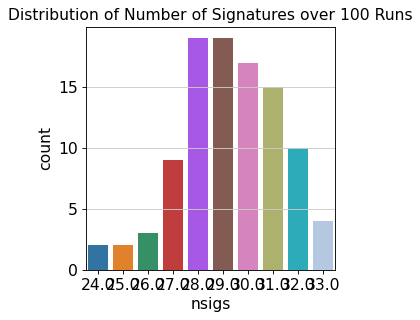

In [317]:
sns.countplot(results.nsigs)
plt.title("Distribution of Number of Signatures over 100 Runs")

Text(0, 0.5, 'bdiv')

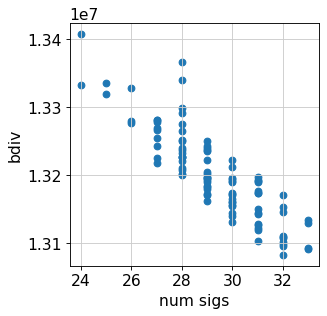

In [318]:
plt.scatter(results.nsigs, results.bdiv_trainset)
plt.xlabel("num sigs")
plt.ylabel("bdiv")
#plt.xticks(np.arange(25,33));

Text(0, 0.5, 'bdiv')

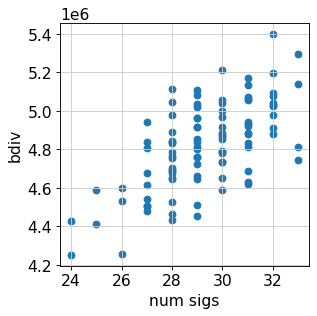

In [319]:
plt.scatter(results.nsigs, results.bdiv_valset)
plt.xlabel("num sigs")
plt.ylabel("bdiv")
#plt.xticks(np.arange(25,33));

Text(0, 0.5, 'loss')

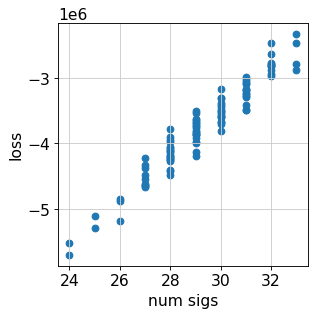

In [320]:
plt.scatter(results.nsigs, results.objective_valset)
plt.xlabel("num sigs")
plt.ylabel("loss")
#plt.xticks(np.arange(25,33));

# load optimal NMF results

In [374]:
def create_pdf(results_path_prefix, outfile_name):
    W=pd.read_csv(results_path_prefix+'W.txt', sep="\t", index_col=0) 
    H=pd.read_csv(results_path_prefix+'H.txt', sep="\t", index_col=0)

    H=H.T

    H = H.divide(cd138_adata.obs.loc[H.index,:].n_counts, axis=0)*10000 #divide each cell by total counts, multiply by 10k
    
    Sidx=W.columns
    tmp_adata = cd138_adata.copy()
    tmp_adata.obs = tmp_adata.obs.drop(columns=np.intersect1d(tmp_adata.obs.columns,Sidx)).join(H)
    tmp_adata.obs['log'+Sidx] = np.log10(H[Sidx]+1)

    UE = W*H.sum() #total activity for this gene, from this signature (multiply gene activity in signature by the sum of cellular activity from this signature)
    FE = (UE.T/UE.T.sum()).T #how much of the genes' activity comes from this signature (specificity of gene to signature)

    R=W*FE

    R['max'] = R.max(axis=1)
    R['max_id'] = np.argmax(R.values,axis=1)+1

    with PdfPages(outfile_name) as pdf:
        for signature in Sidx:
            print(signature, end=", ")

            # Panel 1: Violin plot per-patient
            sns.set(font_scale = 0.85)
            f,ax= plt.subplots(2,2,figsize=(13, 11))
            ax=ax.reshape(-1)

            sc.pl.violin(tmp_adata,'log' + signature,groupby='person',rotation=90,ax=ax[0],show=False)

            # Panel 2: Marker genes
            helper_functions.marker_scatter(R, W, FE, signature,ax=ax[1],nlabel=20)
            ax[1].set_title('Marker genes')

            # Panel 3: UMAP
            sc.pl.umap(tmp_adata,color='log' + signature,ax=ax[2],show=False)

            # Panel 4: Dot plots of marker genes   
            markers = R[signature].sort_values(ascending=False).index[0:10]
            sc.pl.stacked_violin(tmp_adata,markers,ax=ax[3],show=False,groupby='person',swap_axes=True)

            plt.tight_layout()
            pdf.savefig()  # saves the current figure into a pdf page
            plt.close()
    sns.set()

In [375]:
create_pdf(results_path_prefix="/home/rpeyser/GitHub/SignatureAnalyzer-GPU-rpeys//cd138_moreHVG_rmIGproperly/results/nmf_results_3754HVG_take93_", outfile_name='outputs/script5_MOREHVG/K28_NMF_MOREGENES_noIG_run93.pdf')

W1, W2, W3, W4, W5, W6, W7, W8, W9, W10, W11, W12, W13, W14, W15, W16, W17, W18, W19, W20, W21, W22, W23, W24, W25, W26, W27, W28, 

In [49]:
create_pdf(results_path_prefix="~/GitHub/SignatureAnalyzer-GPU/cd138_moreHVG_rmIGproperly/results/nmf_results_3754HVG_take87_", outfile_name='outputs/script5_MOREHVG/K24_NMF_MOREGENES_noIG_run87.pdf')

W1, W2, W3, W4, W5, W6, W7, W8, W9, W10, W11, W12, W13, W14, W15, W16, W17, W18, W19, W20, W21, W22, W23, W24, 

In [18]:
W=pd.read_csv('~/GitHub/SignatureAnalyzer-GPU-rpeys/cd138_moreHVG_rmIGproperly/results/nmf_results_3754HVG_take93_W.txt', sep="\t", index_col=0) 
H=pd.read_csv('~/GitHub/SignatureAnalyzer-GPU-rpeys/cd138_moreHVG_rmIGproperly/results/nmf_results_3754HVG_take93_H.txt', sep="\t", index_col=0)

In [20]:
Sidx = W.columns #W.columns[W.columns.str.match('S\d+')]

In [21]:
H=H.T

# transform H matrix to normalize version because cells have variable number of total counts

In [22]:
H = H.divide(cd138_adata.obs.loc[H.index,:].n_counts, axis=0)*10000 #divide each cell by total counts, multiply by 10k

In [299]:
H.to_csv("outputs/source_data/normalized_H_matrix.csv")

### join H matrix results to observation dataframe

In [30]:
cd138_adata.obs = cd138_adata.obs.join(H)

In [31]:
cd138_adata.obs['log'+Sidx] = np.log10(H[Sidx]+1)

In [32]:
#save this version of anndata and copy to bucket
cd138_adata.write('outputs/script5_MOREHVG/cd138_adata_MOREHVG_noIG.h5ad')
#!gsutil -m cp outputs/script5/cd138_adata.h5ad gs://mm-ghobrial-10x/rebecca_summer2020/outputs/script5/

In [16]:
cd138_adata = sc.read('outputs/script5_MOREHVG/cd138_adata_MOREHVG_noIG.h5ad')
cd138_adata

AnnData object with n_obs × n_vars = 29387 × 22273
    obs: 'person', 'age', 'sorting_tag', 'disease_stage', 'sex', 'disease_stage_short', 'SAMPLE', 'sample_id', 'Type', 'Gender', 'Age at Dx', 'Diagnosis date', 'Race', 'Type.1', 'FISH 1', 'FISH 1 Date', 'FISH 2', 'FISH 2 Date', 'FISH 3', 'FISH 3 Date', 'FISH 4', 'FISH 4 Date', 'BM at Diagnosis', 'M Protein when sample was taken', 'Date of BM Aspirate used for single-cell RNA Seq', 'Infiltration of Used BM or Aspirate', 'BM Transplant', 'Transplant Date', 'Induction', 'XRT', 'Maintenance Tx', 'Relapse Date', 'Total # cells', 'CD138+', 'CD45+', 'CD45-', 'PMH', 'Family Hx', 'Smoking', 'Alcohol', 'Previous Chemo', 'n_genes', 'percent_mito', 'n_counts', 'possible_doublet', 'S_score', 'G2M_score', 'phase', 'prolif_idx', 'EMT_score', 'leiden', '__is_in_cluster__', 'ground_truth', 'ncells_persample', 'hemoglobin_score', 'person_group', 'sample_purity', 'person_oldnames', 'tx', 'HRD', 'driver event', 'driver_event_specific', 'batch', 'vial', 'W

### calculate other signature metrics

In [33]:
UE = W[Sidx]*H[Sidx].sum() #total activity for this gene, from this signature (multiply gene activity in signature by the sum of cellular activity from this signature)
FE = (UE.T/UE.T.sum()).T #how much of the genes' activity comes from this signature (specificity of gene to signature)

R=W[Sidx]*FE[Sidx]

R['max'] = R[Sidx].max(axis=1)
R['max_id'] = np.argmax(R[Sidx].values,axis=1)+1

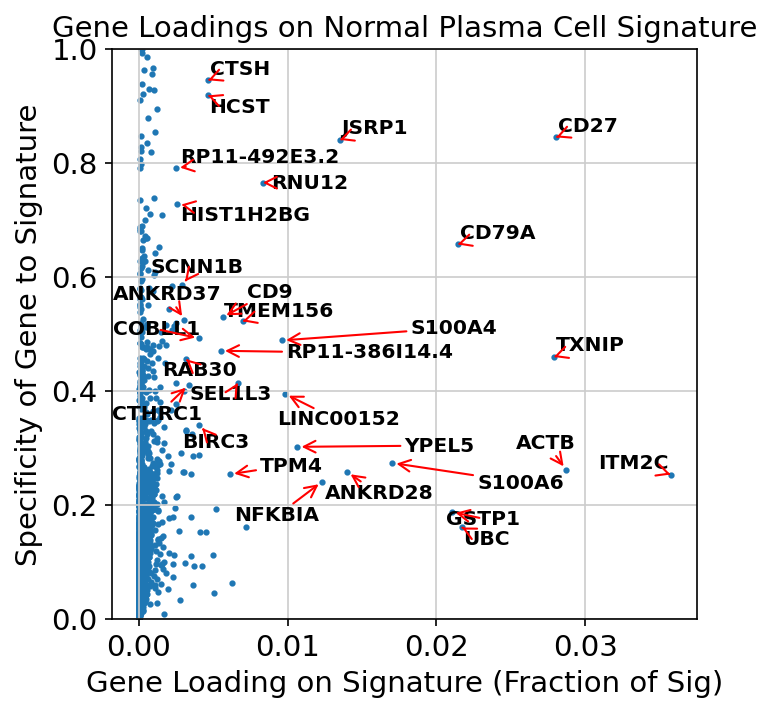

In [24]:
#S22_summary_df = pd.DataFrame({'W':W.S22, 'specificity':FE.S22, 'score':W.S22*FE.S22})
helper_functions.marker_scatter(R, W, FE, 'W16', nlabel=30, ax=None, fontsize='x-small')
plt.title("Gene Loadings on Normal Plasma Cell Signature")
plt.savefig("figures/script5/topgenes_sig16_normalplasmacellsig.pdf", bbox_inches="tight")

In [160]:
for i in R.loc[:,"W16"].sort_values(ascending=False)[:20].index:
    print(i)

CD27
CD79A
TXNIP
JSRP1
ITM2C
ACTB
RNU12
S100A4
S100A6
CTSH
HCST
GSTP1
LINC00152
TMEM156
ANKRD28
UBC
YPEL5
CD9
NFKBIA
SEL1L3


# Understand Each Signature

### print NMF outputs to PDF

# Categorize and name each Signature

In [31]:
signatures_desc = pd.DataFrame({'signature':W[Sidx].columns, 'desc':'', 'type':''}, index=W[Sidx].columns)

#single gene sig, if the difference between the top gene loading and the next gene loading is >= 0.5
for sig in W[Sidx].columns:
    if W[sig].sort_values(ascending=False)[0]-W[sig].sort_values(ascending=False)[1] >= 0.5:
        signatures_desc.loc[sig,'type'] = 'single gene'
        signatures_desc.loc[sig,'desc'] = W[sig].sort_values(ascending=False).index[0]

#single person, if the mean of the signature in that person is >4 sd's higher than in the next highest person (this cutoff set by a manual crosscheck)
#single person will overwrite single gene (which is ok--if its single person we're less interested in the gene driving it)
person_sig_score = cd138_adata.obs[['person']].merge(H, left_index=True, right_index=True).groupby('person').mean()
for sig in H[Sidx].columns:
    tmp=person_sig_score[[sig]]
    if np.sort(scipy.stats.zscore(tmp), axis=0)[-1] - np.sort(scipy.stats.zscore(tmp), axis=0)[-2] > 4: #if mean is 2 sd's higher than all others
        signatures_desc.loc[sig,'type'] = 'patient specific'
        signatures_desc.loc[sig,'desc'] = tmp.index[np.argmax(scipy.stats.zscore(tmp), axis=0)[0]] #person who maximizes the zscore

In [46]:
signatures_desc.loc['W1','desc'] = ''
signatures_desc.loc['W3','desc'] = 'CCND1 (t(11;14) associated)'
signatures_desc.loc['W6','desc'] = ''

signatures_desc.loc['W8','desc'] = 'ITGB7, MAFB, CCND2 (t(14;20) associated)'

signatures_desc.loc['W9','desc'] = 'extracellular signaling'
signatures_desc.loc['W10','desc'] = 'RPL36A'; signatures_desc.loc['W10','type'] = 'single gene'
signatures_desc.loc['W11','desc'] = 'proliferation'
signatures_desc.loc['W12','desc'] = 'monocytic ambient contamination'; signatures_desc.loc['W12','type'] = 'contamination'
signatures_desc.loc['W14','desc'] = ''
signatures_desc.loc['W16','desc'] = 'B-cell like'

signatures_desc.loc['W20','desc'] = 'protein synthesis (ser/thr kinase; elongation factors; pre/mRNA editing) '
signatures_desc.loc['W24','desc'] = 'interferon inducible'
signatures_desc.loc['W26','desc'] = ''
signatures_desc.loc['W27','desc'] = ''
signatures_desc.loc['W28','desc'] = 'CXCR4 & regulators'


In [47]:
#edit single gene/patient sig descs
signatures_desc.loc['W4','desc'] = "HLA class II"; signatures_desc.loc['W4','type'] = ''
signatures_desc.loc['W5','desc'] = "histones"; signatures_desc.loc['W5','type'] = ''


In [43]:
top_genes = []
for sig in signatures_desc.signature:
    top_genes.append(list(R[sig].sort_values(ascending=False)[:4].index))
signatures_desc['top_genes'] = top_genes

In [49]:
signatures_desc.to_csv("outputs/script5_MOREHVG/signaturesdesc_MOREGENES_noIG_run93.csv", index=False)

In [15]:
signatures_desc = pd.read_csv("outputs/script5_MOREHVG/signaturesdesc_MOREGENES_noIG_run93.csv")
signatures_desc

,signature,desc,type,top_genes
0,W1,NaN,NaN,"['JUNB', 'ZFP36', 'NFKBIA', 'IER2']"
1,W2,MM-1,patient specific,"['MTDH', 'HLA-A', 'IFI27', 'SNHG25']"
2,W3,CCND1 (t(11;14) associated),NaN,"['CCND1', 'TSC22D3', 'RP5-887A10.1', 'RGS13']"
3,W4,HLA class II,NaN,"['HLA-DRA', 'HLA-DRB1', 'HLA-DPA1', 'HLA-DPB1']"
4,W5,histones,NaN,"['HIST1H1C', 'HIST1H2AC', 'HIST1H2BC', 'KIAA05..."
5,W6,NaN,NaN,"['DUSP4', 'GADD45A', 'BTG2', 'LAMP5']"
6,W7,MM-4,patient specific,"['IFI6', 'PTP4A3', 'HLA-A', 'LAG3']"
7,W8,"ITGB7, MAFB, CCND2 (t(14;20) associated)",NaN,"['ITGB7', 'AC233755.2', 'SPP1', 'CCND2']"
8,W9,extracellular signaling,NaN,"['LGALS1', 'VIM', 'ACTB', 'S100A6']"
9,W10,RPL36A,single gene,"['RPL36A', 'NBEAL1', 'IFITM1', 'LAMP5']"


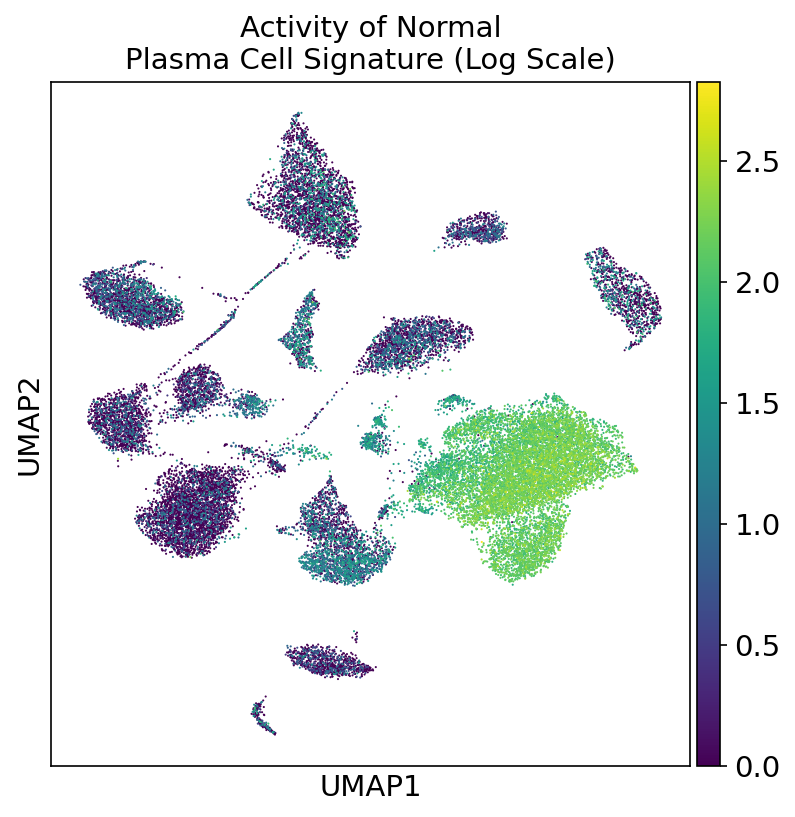

In [32]:
sc.pl.umap(cd138_adata, color=['logW16'], title="Activity of Normal\nPlasma Cell Signature (Log Scale)", save="_logW16.pdf")

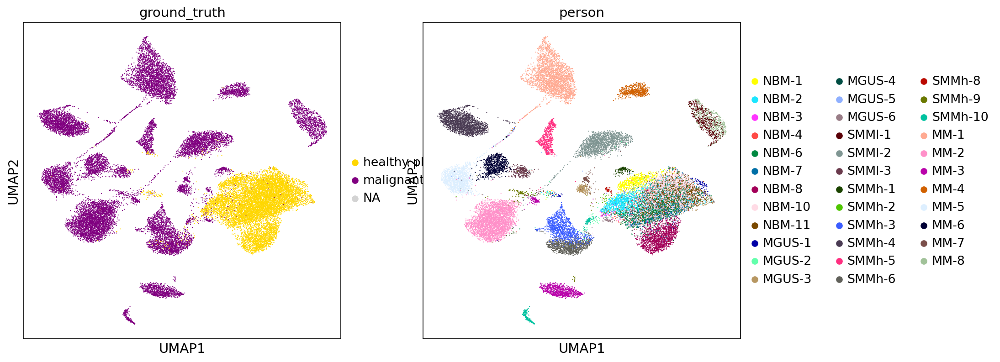

In [178]:
sc.pl.umap(cd138_adata, color=['ground_truth','person'])

### visualize top genes on signatures

In [61]:
df_top_genes_sigs = R.reset_index().rename(columns={"index":"gene"}).drop(columns=['max', 'max_id']).melt(id_vars="gene", var_name="signature").rename(columns={"value":"relative importance"}).sort_values(['signature','relative importance'], ascending=False).groupby('signature').head(10)
#limit to 'interpretable' signatures which I'll include in figure
df_top_genes_sigs = df_top_genes_sigs.merge(signatures_desc[(pd.isna(signatures_desc.type))&(~pd.isna(signatures_desc.desc))], on="signature")
df_top_genes_sigs.loc[df_top_genes_sigs.desc=="protein synthesis (ser/thr kinase; elongation factors; pre/mRNA editing) ","desc"]="protein synthesis"
df_top_genes_sigs['title'] = df_top_genes_sigs.signature+": "+df_top_genes_sigs.desc

In [62]:
#for figure, I want there to be 9 facets, not 10. will drop 'extracellular signaling'
df_top_genes_sigs = df_top_genes_sigs[df_top_genes_sigs.signature!="W9"]

In [63]:
df_top_genes_sigs.loc[df_top_genes_sigs.title=="W16: B-cell like",'title'] = "W16: Normal Plasma Cell"

/anaconda3/envs/mm_singlecell_v2/lib/python3.6/site-packages/seaborn/categorical.py:3805: UserWarning: Setting `sharey=False` with `color=None` may cause different levels of the `y` variable to share colors. This will change in a future version.
  warnings.warn(msg.format("sharey", "y"), UserWarning)


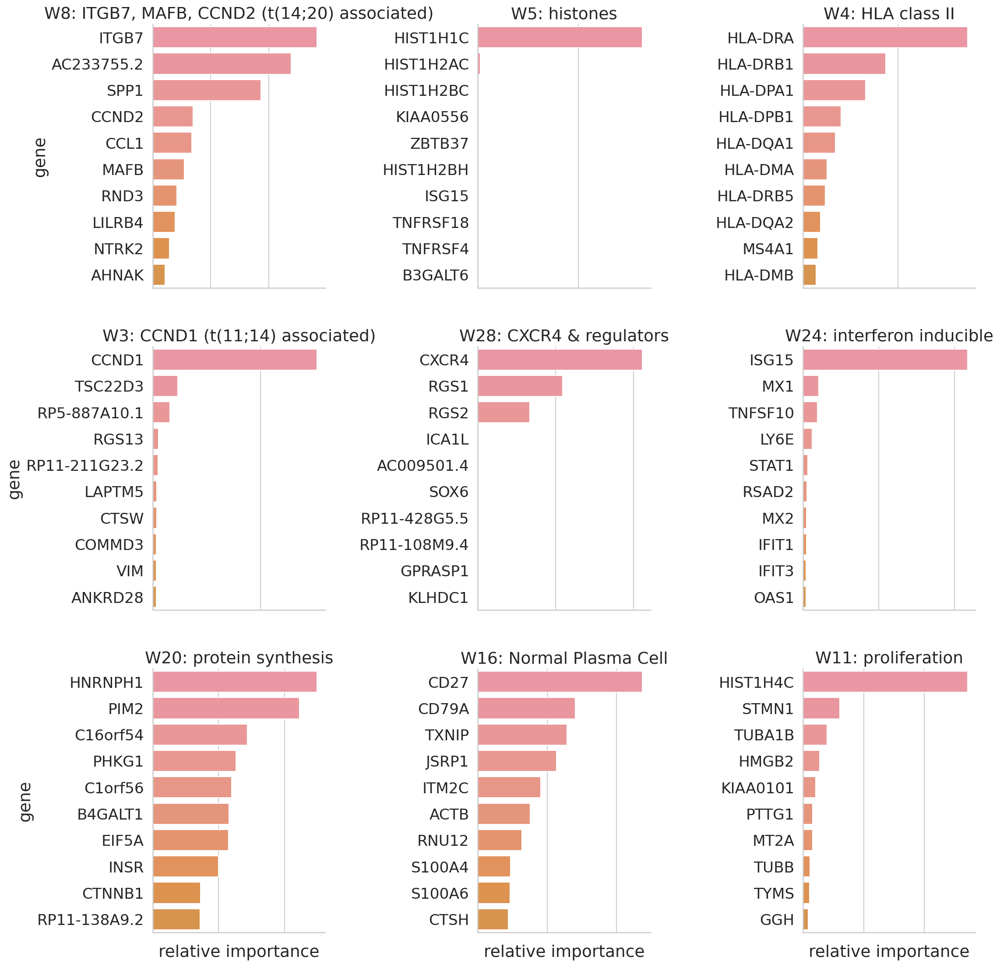

In [65]:
sns.set(style="whitegrid", font_scale=1.5)
g = sns.catplot(data=df_top_genes_sigs, y="gene", x="relative importance", col="title", col_wrap=3, kind="bar", sharex=False, sharey=False)
g.set_titles(template='{col_name}')
g.set(xticklabels=[]) #no need for xtick labels
plt.savefig("figures/script5/sig_topgenes_summary.pdf", bbox_inches="tight")

### validation with CCND1 signature

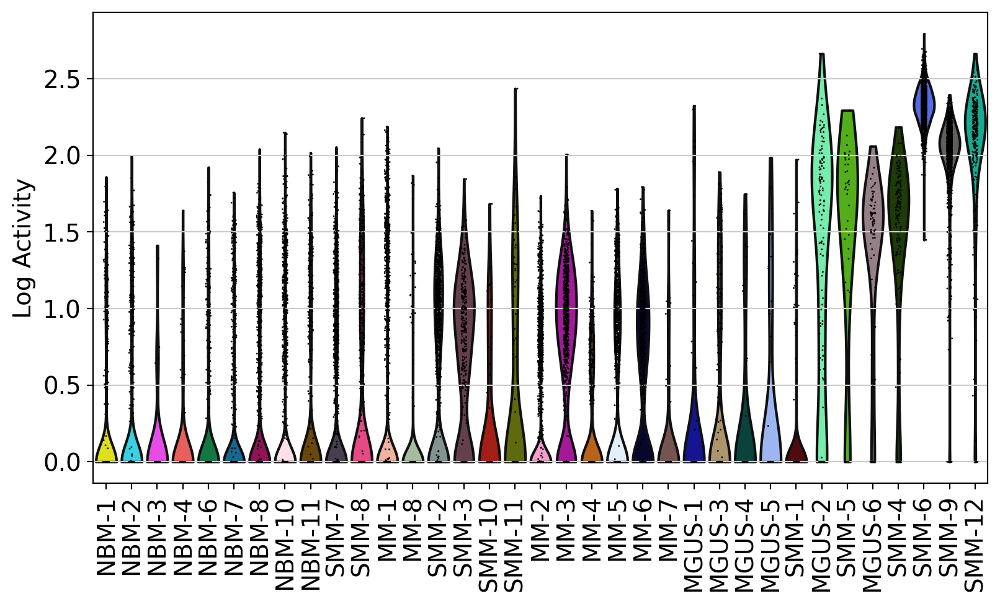

In [79]:
sc.settings.set_figure_params(figsize=[8,5], dpi=200, format='png')
sc.pl.violin(cd138_adata, keys="logW3", groupby="person", rotation=90, ylabel="Log Activity",
    order=[
    'NBM-1', 'NBM-2', 'NBM-3', 'NBM-4', 'NBM-6', 'NBM-7', 'NBM-8', 'NBM-10', 'NBM-11', #NBM
    'SMM-7', 'SMM-8', 'MM-1', #t(4;14)
    'MM-8', #t(14;20)
    'SMM-2', 'SMM-3','SMM-10', 'SMM-11', 'MM-2', 'MM-3', 'MM-4','MM-5', 'MM-6','MM-7', #hyperdiploid (only. some translocated are also HRD)
    'MGUS-1', 'MGUS-3', 'MGUS-4', 'MGUS-5', 'SMM-1', 'MGUS-2','SMM-5', #insufficient cells
     'MGUS-6', 'SMM-4', 'SMM-6', 'SMM-9', 'SMM-12', #t(11;14)    
    ], save="_CCND1_sig.pdf")
sc.settings.set_figure_params(figsize=[6,6], dpi=150, format='png')

# Analyze Signatures Across Disease Stages

In [196]:
person_mean_activity_long = cd138_adata.obs.groupby(['person','ground_truth'])[Sidx].mean().reset_index().merge(cd138_adata.obs[['person','disease_stage']], left_on="person", right_on="person").drop_duplicates().reset_index().drop(columns="index").melt(id_vars=["person", "ground_truth", "disease_stage"], var_name="signature", value_name='mean_activity')
person_mean_activity_long = person_mean_activity_long.dropna() #drop columns with NA under mean_activity
person_mean_activity_long = person_mean_activity_long.merge(signatures_desc, left_on="signature", right_on="signature").rename(columns={'desc':'signature_desc'})
#add std
person_mean_activity_long = cd138_adata.obs.groupby(['person','ground_truth'])[Sidx].std().reset_index().melt(id_vars=["person", "ground_truth"], var_name="signature", value_name='stdev').merge(person_mean_activity_long, left_on=['person','ground_truth','signature'], right_on=['person','ground_truth','signature'])
#add n
person_mean_activity_long = cd138_adata.obs.groupby(['person','ground_truth']).size().reset_index().rename(columns={0:'n'}).merge(person_mean_activity_long, left_on=['person','ground_truth'], right_on=['person','ground_truth'])

In [197]:
# add median
tmp = cd138_adata.obs.groupby(['person','ground_truth'])[Sidx].median().reset_index().melt(id_vars=["person", "ground_truth"], var_name="signature", value_name='median_activity')
person_mean_activity_long = person_mean_activity_long.merge(tmp, on =['person','ground_truth','signature'])

In [198]:
person_mean_activity_long['title'] = person_mean_activity_long.signature + ' (' + person_mean_activity_long.signature_desc + ')'

In [199]:
person_mean_activity_long['group'] = person_mean_activity_long.disease_stage.astype(str) + ' ' + person_mean_activity_long.ground_truth.astype(str)

## test for significance - Kruskal-Wallis + Dunns
#### First summarize each patient by their mean activity for each sig. 
#### Then use Kruskal-Wallis to test whether the mean of mean expression among patients in different disease stages differ, with Bonferroni correction (q<0.1)
#### Then use Dunns to find out where the significant differences are (Bonferroni q<0.1) 
#### multiply by number of sigs tested to further correct fpr multiple hypotheses (FWER)

In [272]:
kw_pvals = []
for sig in signatures_desc[pd.isna(signatures_desc.type)].signature: #only test non single patient/gene sigs
    a=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.disease_stage=='NBM')].mean_activity
    b=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.ground_truth=='malignant') & (person_mean_activity_long.disease_stage=='MGUS')].mean_activity
    c=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.ground_truth=='malignant') & (person_mean_activity_long.disease_stage=='SMM')].mean_activity
    d=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.ground_truth=='malignant') & (person_mean_activity_long.disease_stage=='MM')].mean_activity
    e=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.ground_truth=='healthy plasma') & (person_mean_activity_long.disease_stage=='MGUS')].mean_activity
    f=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.ground_truth=='healthy plasma') & (person_mean_activity_long.disease_stage=='SMM')].mean_activity
    g=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.ground_truth=='healthy plasma') & (person_mean_activity_long.disease_stage=='MM')].mean_activity
    res = scipy.stats.kruskal(a,b,c,d,e,f,g)
    kw_pvals.append(res[1])

In [291]:
signif_sigs=[]
#correct KW using Bonferonni and find signif sigs to feed into post-hoc test
for sig in signatures_desc[pd.isna(signatures_desc.type)].signature[statsmodels.stats.multitest.multipletests(kw_pvals, alpha=0.1, method='bonferroni')[0]]:
    signif_sigs.append(sig)
    print(sig + " (" + signatures_desc.loc[signatures_desc.signature==sig,"desc"] + ")")# statistically different between disease stages! " + str(res))

2    W3 (CCND1 (t(11;14) associated))
Name: desc, dtype: object
15    W16 (B-cell like)
Name: desc, dtype: object
23    W24 (interferon inducible)
Name: desc, dtype: object


In [296]:
#there are 9 pairwise tests I care about - each malignant group vs. NBM, each healthy group across disease stages vs. NBM, each malignant group across disease stages vs. each other
#Dunn follow up tests
signif_sigs2 = []
for sig in signif_sigs:
    res = sp.posthoc_dunn(person_mean_activity_long.loc[person_mean_activity_long.signature==sig,["mean_activity","group"]], group_col="group", val_col="mean_activity", p_adjust=None)
    res = pd.melt(res.reset_index().rename(columns={'index':'group1'}), id_vars="group1", var_name="group2", value_name="qval").drop_duplicates() #drop_dup because matrix was symmetric
    res['FWER_q']= res.qval*9
    res = res[res.FWER_q<0.1]
    if len(res)>0:
        print(sig + " (" + signatures_desc.loc[signatures_desc.signature==sig,"desc"] + ")")
        signif_sigs2.append(sig)
        print(res)
        print("\n")

2    W3 (CCND1 (t(11;14) associated))
Name: desc, dtype: object
                group1              group2      qval    FWER_q
11  NBM healthy plasma      MGUS malignant  0.006301  0.056706
18  NBM healthy plasma   MM healthy plasma  0.006301  0.056706
29      MGUS malignant  NBM healthy plasma  0.006301  0.056706
30   MM healthy plasma  NBM healthy plasma  0.006301  0.056706
34       SMM malignant  NBM healthy plasma  0.001511  0.013599
46  NBM healthy plasma       SMM malignant  0.001511  0.013599


15    W16 (B-cell like)
Name: desc, dtype: object
                 group1               group2          qval    FWER_q
3          MM malignant  MGUS healthy plasma  1.321890e-04  0.001190
6         SMM malignant  MGUS healthy plasma  1.907858e-03  0.017171
21  MGUS healthy plasma         MM malignant  1.321890e-04  0.001190
25   NBM healthy plasma         MM malignant  1.493094e-07  0.000001
26   SMM healthy plasma         MM malignant  3.175865e-03  0.028583
31         MM malignant   NBM

### write person_mean_activity_long to file so can run trend test in R

In [60]:
person_mean_activity_long.to_csv("outputs/script5/person_mean_activity_long.csv", index=False)

## are signatures correlated with batch?
## test for significance - Kruskal-Wallis + Dunns 
#### First summarize each patient by their mean activity for each sig. 
#### Then use Kruskal-Wallis to test whether the mean of mean expression among patients in different batches (p<0.05)
#### Then use Dunns to find out where the significant differences are (Bonferroni<0.1)

#### sex:

In [185]:
person_mean_activity_long = cd138_adata.obs.groupby(['person','sex','ground_truth'])[Sidx].mean().reset_index().drop_duplicates().reset_index().drop(columns="index").melt(id_vars=["person", "sex","ground_truth"], var_name="signature", value_name='mean_activity')
person_mean_activity_long = person_mean_activity_long.dropna()
person_mean_activity_long = person_mean_activity_long.merge(signatures_desc, left_on="signature", right_on="signature").rename(columns={'desc':'signature_desc'})
#add std
person_mean_activity_long = cd138_adata.obs.groupby(['person','sex','ground_truth'])[Sidx].std().reset_index().melt(id_vars=["person", "sex", "ground_truth"], var_name="signature", value_name='stdev').merge(person_mean_activity_long, left_on=['person','sex','signature','ground_truth'], right_on=['person','sex','signature','ground_truth'])
#add n
person_mean_activity_long = cd138_adata.obs.groupby(['person','sex','ground_truth']).size().reset_index().rename(columns={0:'n'}).merge(person_mean_activity_long, left_on=['person','sex','ground_truth'], right_on=['person','sex','ground_truth'])

person_mean_activity_long['title'] = person_mean_activity_long.signature + ' (' + person_mean_activity_long.signature_desc + ')'

In [187]:
signif_sigs = []
for sig in signatures_desc[pd.isna(signatures_desc.type)].signature: #only test non single patient/signature sigs
    a=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.sex=='male') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    b=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.sex=='female') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    res = scipy.stats.ranksums(a,b)
    if res[1]<0.05:
        signif_sigs.append(sig)
        print(sig + " (" + signatures_desc.loc[signatures_desc.signature==sig,"desc"] + ")")# statistically different between ___! " + str(res))

#### vial:

In [188]:
person_mean_activity_long = cd138_adata.obs.groupby(['person','vial','ground_truth'])[Sidx].mean().reset_index().drop_duplicates().reset_index().drop(columns="index").melt(id_vars=["person", "vial",'ground_truth'], var_name="signature", value_name='mean_activity')
person_mean_activity_long = person_mean_activity_long.dropna()
person_mean_activity_long = person_mean_activity_long.merge(signatures_desc, left_on="signature", right_on="signature").rename(columns={'desc':'signature_desc'})
#add std
person_mean_activity_long = cd138_adata.obs.groupby(['person','vial','ground_truth'])[Sidx].std().reset_index().melt(id_vars=["person", "vial",'ground_truth'], var_name="signature", value_name='stdev').merge(person_mean_activity_long, left_on=['person','vial','ground_truth','signature'], right_on=['person','vial','ground_truth','signature'])
#add n
person_mean_activity_long = cd138_adata.obs.groupby(['person','vial','ground_truth']).size().reset_index().rename(columns={0:'n'}).merge(person_mean_activity_long, left_on=['person','vial','ground_truth'], right_on=['person','vial','ground_truth'])

person_mean_activity_long['title'] = person_mean_activity_long.signature + ' (' + person_mean_activity_long.signature_desc + ')'

In [189]:
signif_sigs = []
for sig in signatures_desc[pd.isna(signatures_desc.type)].signature: #only test non single patient/signature sigs

    a=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.vial=='fresh') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    b=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.vial=='frozen') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    res = scipy.stats.ranksums(a,b)
    
    if res[1]<0.05:
        signif_sigs.append(sig)
        print(sig + " (" + signatures_desc.loc[signatures_desc.signature==sig,"desc"] + ")")# statistically different between ___! " + str(res))

#### batch:

In [191]:
person_mean_activity_long = cd138_adata.obs.groupby(['person','batch','ground_truth'])[Sidx].mean().reset_index().drop_duplicates().reset_index().drop(columns="index").melt(id_vars=["person", "batch",'ground_truth'], var_name="signature", value_name='mean_activity')
person_mean_activity_long = person_mean_activity_long.merge(signatures_desc, left_on="signature", right_on="signature").rename(columns={'desc':'signature_desc'})
person_mean_activity_long = person_mean_activity_long.drop(columns=["type"]).dropna()
#add std
person_mean_activity_long = cd138_adata.obs.groupby(['person','batch','ground_truth'])[Sidx].std().reset_index().melt(id_vars=["person", "batch",'ground_truth'], var_name="signature", value_name='stdev').merge(person_mean_activity_long, left_on=['person','batch','ground_truth','signature'], right_on=['person','batch','ground_truth','signature'])
#add n
person_mean_activity_long = cd138_adata.obs.groupby(['person','batch','ground_truth']).size().reset_index().rename(columns={0:'n'}).merge(person_mean_activity_long, left_on=['person','batch','ground_truth'], right_on=['person','batch','ground_truth'])


In [192]:
person_mean_activity_long['title'] = person_mean_activity_long.signature + ' (' + person_mean_activity_long.signature_desc + ')'

In [193]:
person_mean_activity_long.batch.value_counts()

Dec     437
Nov     299
Oct     115
Sept     69
May      69
Feb      69
Name: batch, dtype: int64

In [194]:
signif_sigs = []
for sig in signatures_desc[pd.isna(signatures_desc.type)].signature: #only test non single patient/signature sigs

    a=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.batch=='Dec') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    b=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.batch=='Nov') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    c=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.batch=='Oct') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    d=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.batch=='May') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    e=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.batch=='Feb') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    f=person_mean_activity_long[(person_mean_activity_long.signature==sig) & (person_mean_activity_long.batch=='Sept') & (person_mean_activity_long.ground_truth=='healthy plasma')].mean_activity
    res = scipy.stats.kruskal(a,b,c,d,e,f)
    
    if res[1]<0.05:
        signif_sigs.append(sig)
        print(sig + " (" + signatures_desc.loc[signatures_desc.signature==sig,"desc"] + ")")# statistically different between ___! " + str(res))

## Plot expression across disease stages

#### calculate standard error to plot

In [30]:
#calculate std error of mean
bootstrapped_means = helper_functions.bootstrap_means_sigs(cd138_adata, sig_colnames=signif_sigs2 + ['W28'], n_bootstrap=10000)
boot_SE = helper_functions.calc_boot_SE(bootstrapped_means)

In [31]:
boot_SE = boot_SE.dropna()

In [32]:
person_mean_activity_long = person_mean_activity_long.merge(boot_SE, on=['person','ground_truth','signature'], how="outer")

#### also add group to obs

In [33]:
cd138_adata.obs['person_group'] = cd138_adata.obs.person.astype(str) + ' ' + cd138_adata.obs.ground_truth.astype(str)

In [34]:
#will sort x axis in this order
person_mean_activity_long.group = pd.Categorical(person_mean_activity_long.group, categories=[
    'NBM healthy plasma', 'MGUS malignant','SMM malignant', 'MM malignant', 'MGUS healthy plasma','SMM healthy plasma', 'MM healthy plasma'], ordered=True)
    #'NBM healthy plasma', 'MGUS malignant','SMMl malignant', 'SMMh malignant', 'MM malignant', 'MGUS healthy plasma','SMMl healthy plasma', 'SMMh healthy plasma', 'MM healthy plasma'], ordered=True)

In [35]:
ppl_who_need_lines = person_mean_activity_long[['person','ground_truth']].drop_duplicates().groupby('person').size()
ppl_who_need_lines = ppl_who_need_lines.index[ppl_who_need_lines>1]
ppl_who_need_lines

CategoricalIndex(['MGUS-2', 'MGUS-3', 'MGUS-6', 'SMM-2', 'SMM-3', 'SMM-8',
                  'SMM-9', 'SMM-10', 'MM-3', 'MM-4', 'MM-6'],
                 categories=['NBM-1', 'NBM-2', 'NBM-3', 'NBM-4', 'NBM-6', 'NBM-7', 'NBM-8', 'NBM-10', ...], ordered=True, name='person', dtype='category')

In [36]:
person_mean_activity_long.disease_stage = pd.Categorical(person_mean_activity_long.disease_stage, categories=[
    'MM','SMM','MGUS','NBM'], ordered=True) #'SMMh','SMMl'
person_mean_activity_long.sort_values(['disease_stage','mean_activity'], ascending=False, inplace=True)

In [37]:
person_mean_activity_long.loc[person_mean_activity_long.signature=="W16","signature_desc"] = "Normal Plasma Cell"

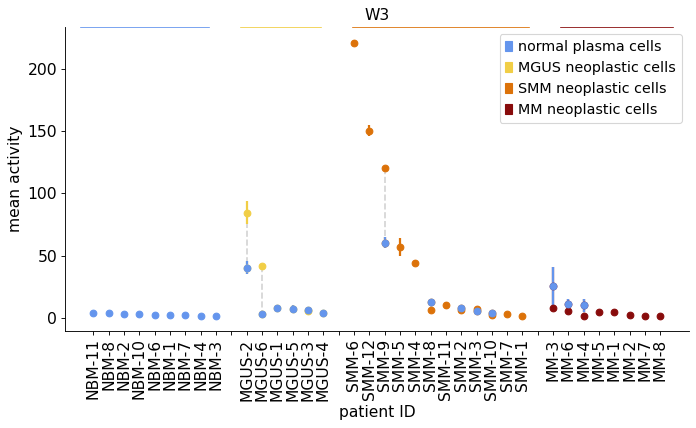

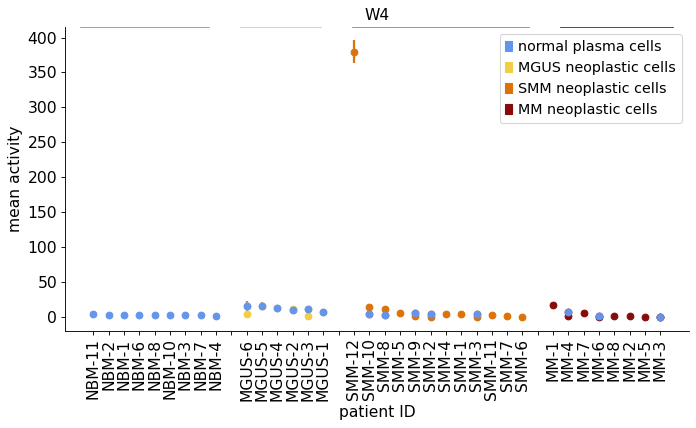

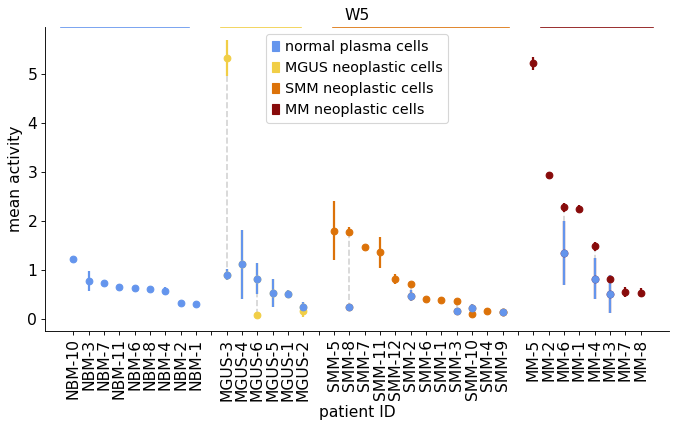

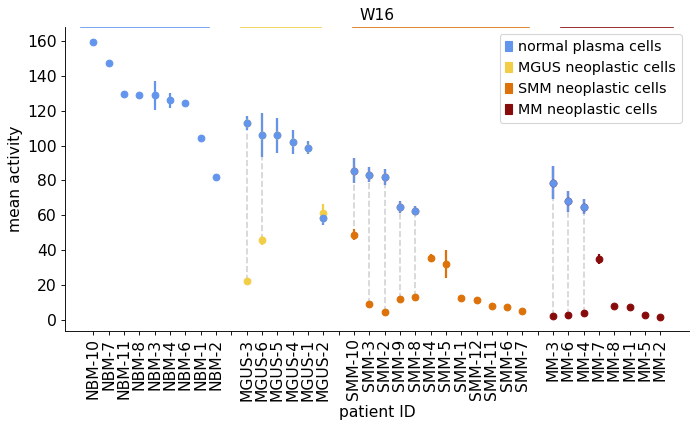

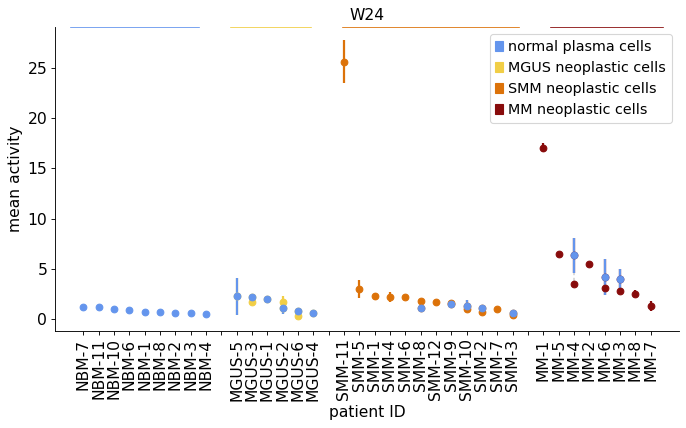

In [38]:
for sig in signif_sigs2: #need to loop because xticklabels arent working properly otherwise
    helper_functions.plot_per_patient_healthymalig(person_mean_activity_long, [sig], facet_col='signature', value_col='mean_activity', 
                                                   ds_colors=cd138_adata.uns["disease_stage_colors"], ylabel='mean activity', ncols=1, ptsize=6, 
                                                   sharey=False, sharex=False, figsize=None, filename="figures/script5/hamburgerplot_{}.pdf".format(sig), dpi=180)
    

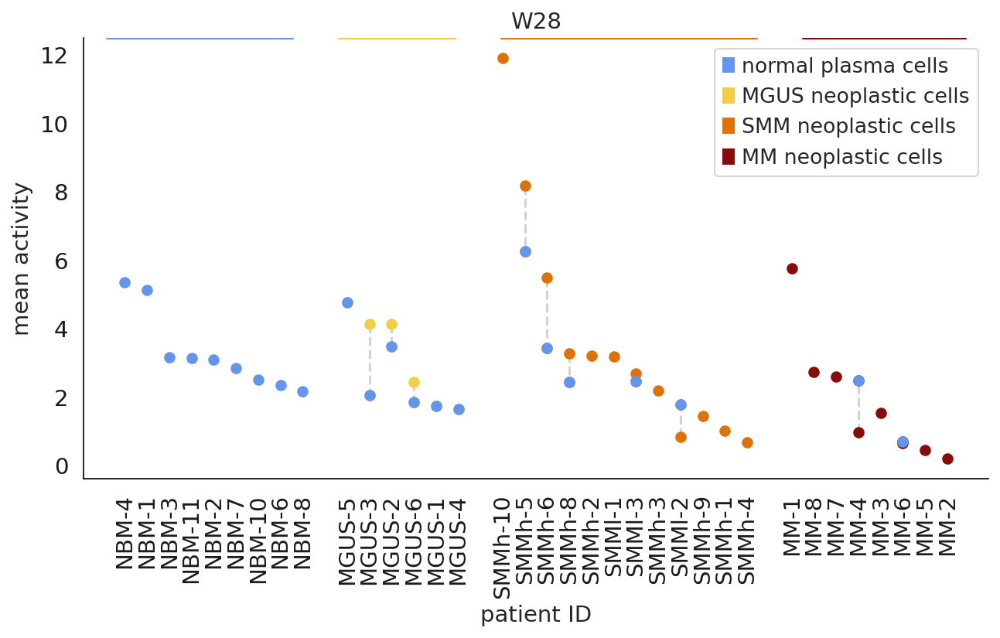

In [80]:
for sig in ['W28']: #need to loop because xticklabels arent working properly otherwise
    helper_functions.plot_per_patient_healthymalig(person_mean_activity_long, [sig], facet_col='signature', value_col='mean_activity', 
                                                   ds_colors=cd138_adata.uns["disease_stage_colors"], ylabel='mean activity', ncols=1, 
                                                   ptsize=6, sharey=False, sharex=False, figsize=None, filename=None)

In [48]:
person_mean_activity_long['log_mean_activity'] = np.log10(person_mean_activity_long.mean_activity)

In [49]:
#temporarily disable error bars for plotting on log scale
tmp = person_mean_activity_long.copy()
tmp.stderror = None #np.log10(tmp.stderror)

In [51]:
# function to convert to subscript
def get_sub(x):
        normal = "ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789+-=()"
        sub_s = "ₐ₈CDₑբGₕᵢⱼₖₗₘₙₒₚQᵣₛₜᵤᵥwₓᵧZₐ♭꜀ᑯₑբ₉ₕᵢⱼₖₗₘₙₒₚ૧ᵣₛₜᵤᵥwₓᵧ₂₀₁₂₃₄₅₆₇₈₉₊₋₌₍₎"
        res = x.maketrans(''.join(normal), ''.join(sub_s))
        return x.translate(res)

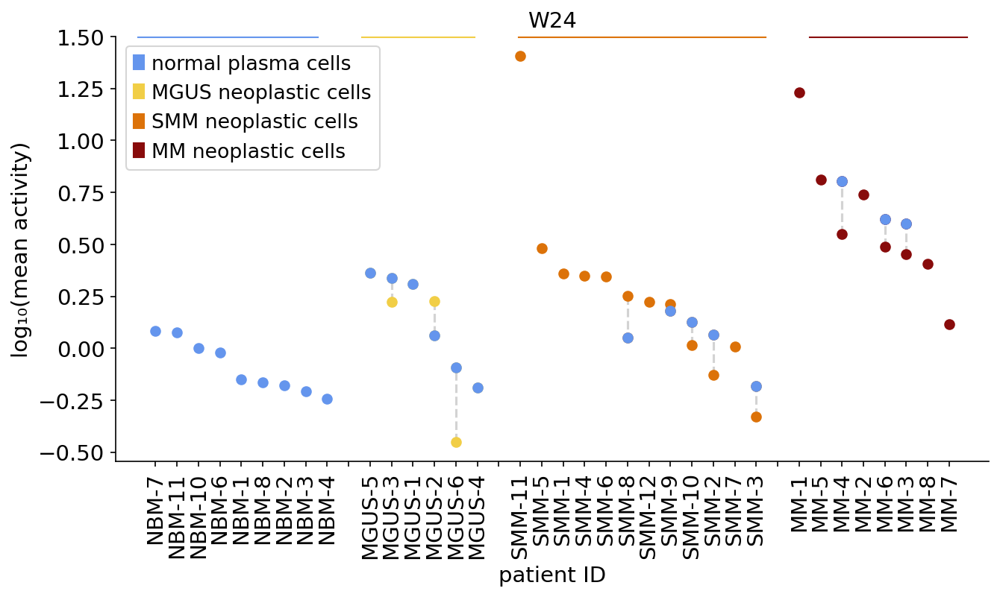

In [52]:
for sig in ['W24']: #need to loop because xticklabels arent working properly otherwise
    helper_functions.plot_per_patient_healthymalig(tmp, [sig], facet_col='signature', value_col='log_mean_activity', 
                                                   ds_colors=cd138_adata.uns["disease_stage_colors"], ylabel='log{}(mean activity)'.format(get_sub('10')), ncols=1, 
                                                   ptsize=6, sharey=False, sharex=False, figsize=None, filename="figures/script5/hamburgerplot_logscale_{}.pdf".format(sig))

## Does normal plasma cell signature correlate with 20/2/20?

In [94]:
person_mean_activity_long = cd138_adata.obs.groupby(['person','ground_truth'])[Sidx].mean().reset_index().merge(cd138_adata.obs[['person','disease_stage']], left_on="person", right_on="person").drop_duplicates().reset_index().drop(columns="index").melt(id_vars=["person", "ground_truth", "disease_stage"], var_name="signature", value_name='mean_activity')
person_mean_activity_long = person_mean_activity_long.merge(signatures_desc, left_on="signature", right_on="signature").rename(columns={'desc':'signature_desc'})
person_mean_activity_long = person_mean_activity_long.drop(columns=["type"]).dropna()
#add std
person_mean_activity_long = cd138_adata.obs.groupby(['person','ground_truth'])[Sidx].std().reset_index().melt(id_vars=["person", "ground_truth"], var_name="signature", value_name='stdev').merge(person_mean_activity_long, left_on=['person','ground_truth','signature'], right_on=['person','ground_truth','signature'])
#add n
person_mean_activity_long = cd138_adata.obs.groupby(['person','ground_truth']).size().reset_index().rename(columns={0:'n'}).merge(person_mean_activity_long, left_on=['person','ground_truth'], right_on=['person','ground_truth'])

In [95]:
person_mean_activity_long['title'] = person_mean_activity_long.signature + ' (' + person_mean_activity_long.signature_desc + ')'

In [96]:
person_mean_activity_long['group'] = person_mean_activity_long.disease_stage.astype(str) + ' ' + person_mean_activity_long.ground_truth.astype(str)

In [97]:
clinical_data = pd.read_csv("data/clinical_data.csv")
toplot = person_mean_activity_long.merge(clinical_data[['sample_ID','20/2/20 risk for SMM']], left_on="person", right_on="sample_ID", how="left")
toplot=toplot[toplot.disease_stage=="SMM"]

In [99]:
#limit to neoplastic cells
toplot=toplot[toplot.ground_truth=="malignant"]

In [101]:
# limit to w16
toplot= toplot[toplot.signature=="W16"]

In [100]:
toplot['20/2/20 risk for SMM'] = pd.Categorical(toplot['20/2/20 risk for SMM'], 
                                                categories=['low', 'intermediate', 'high'], ordered=True)

Text(0, 0.5, 'mean activity for\nnormal plasma cell signature')

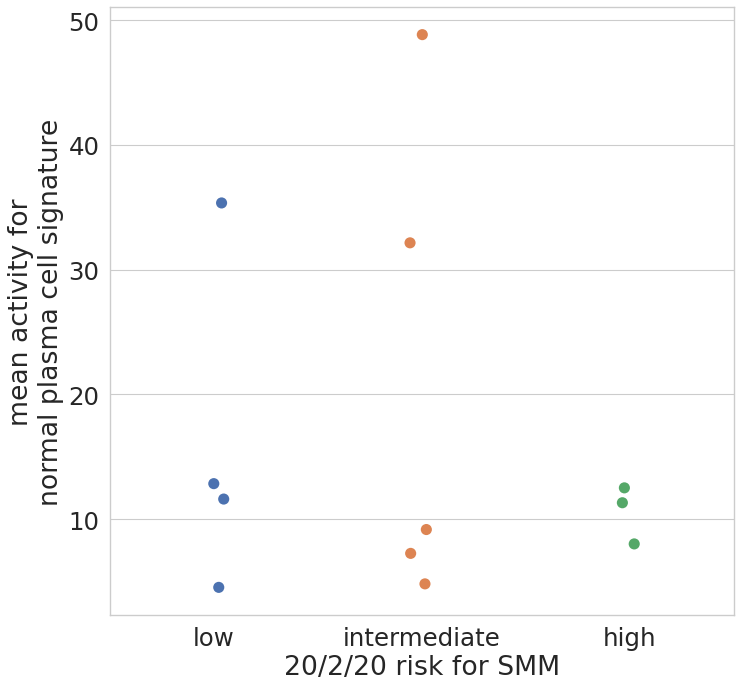

In [72]:
sns.set(font_scale=2, style="whitegrid")
g=sns.stripplot(data=toplot, y='mean_activity', x='20/2/20 risk for SMM', size=10)
g.set_ylabel("mean activity for\nnormal plasma cell signature")

In [103]:
a=toplot[toplot['20/2/20 risk for SMM']=="low"].mean_activity
b=toplot[toplot['20/2/20 risk for SMM']=="intermediate"].mean_activity
c=toplot[toplot['20/2/20 risk for SMM']=="high"].mean_activity

res = scipy.stats.kruskal(a,b,c)

print(res)

KruskalResult(statistic=0.13846153846154152, pvalue=0.9331113218481647)


## Does CD27 signature correlate with age?

In [46]:
tmp = person_mean_activity_long[person_mean_activity_long.signature=="W16"].merge(cd138_adata.obs[['person','age']].drop_duplicates(), on="person")
tmp = tmp.loc[tmp.ground_truth=="healthy plasma",['mean_activity','age']].dropna()
scipy.stats.spearmanr(tmp['mean_activity'], tmp['age'])


SpearmanrResult(correlation=-0.17801645277086298, pvalue=0.4280145658367729)

In [47]:
tmp = person_mean_activity_long[person_mean_activity_long.signature=="W16"].merge(cd138_adata.obs[['person','age']].drop_duplicates(), on="person")
tmp = tmp.loc[tmp.ground_truth=="healthy plasma",['mean_activity','age']].dropna()
scipy.stats.pearsonr(tmp['mean_activity'], tmp['age'])


(-0.2592876537679461, 0.2439220709069019)

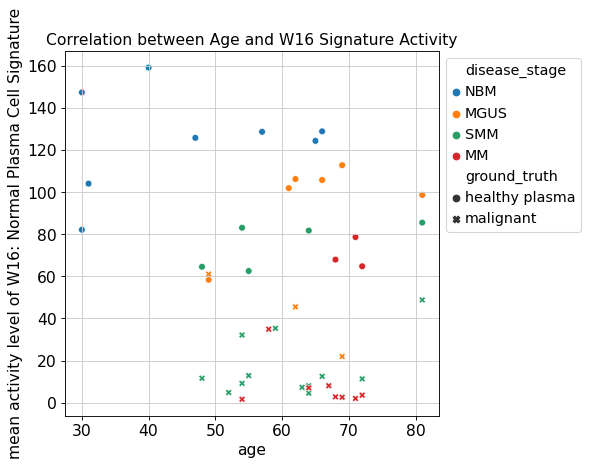

In [52]:
fig, ax = plt.subplots(1,1, figsize=[6,6])
sns.scatterplot(y="mean_activity", x="age", hue="disease_stage", style="ground_truth", ax=ax,
                data=person_mean_activity_long[person_mean_activity_long.signature=="W16"].merge(cd138_adata.obs[['person','age']].drop_duplicates(), on="person"))
plt.ylabel("mean activity level of W16: Normal Plasma Cell Signature")
plt.title("Correlation between Age and W16 Signature Activity")
ax.legend(loc='upper left', bbox_to_anchor=(1,1))

# Correlate individual genes with disease stage

In [35]:
signif_genes = []
corr = []
for gene_idx in np.where(cd138_adata.var.highly_variable)[0]: #for each highly variable gene
    results = scipy.stats.spearmanr(cd138_adata.X[:,gene_idx], cd138_adata.obs.disease_stage.map({'NBM':0, 'MGUS':1, "SMMl":2, "SMMh":3, "MM":4}))
    if np.absolute(results[0])>0.45:
        print(str(cd138_adata.var.index[gene_idx]) + " " + str(results[0]))
        signif_genes.append(cd138_adata.var.index[gene_idx])
        corr.append(results[0])

IFI6 0.5259474374464066
RP5-887A10.1 0.5779610661410207
YPEL5 -0.4626040404764631
ANKRD28 -0.4560164468835964
TMSB4X -0.47975590637794957
IFITM1 0.5211523405999244
CD27 -0.656480646853192
UBC -0.47621998878761035
NFKBIA -0.4827762806670015
IFI27 0.5864143495988845
HERPUD1 -0.5856108316516858
SNHG25 0.4767765697953407
H3F3B -0.6223912424690949
CD79A -0.5430652019251366
XBP1 -0.4506024534810848


In [36]:
pd.DataFrame({"gene":signif_genes, "r":np.around(corr,3)})

,gene,r
0,IFI6,0.526
1,RP5-887A10.1,0.578
2,YPEL5,-0.463
3,ANKRD28,-0.456
4,TMSB4X,-0.480
5,IFITM1,0.521
6,CD27,-0.656
7,UBC,-0.476
8,NFKBIA,-0.483
9,IFI27,0.586


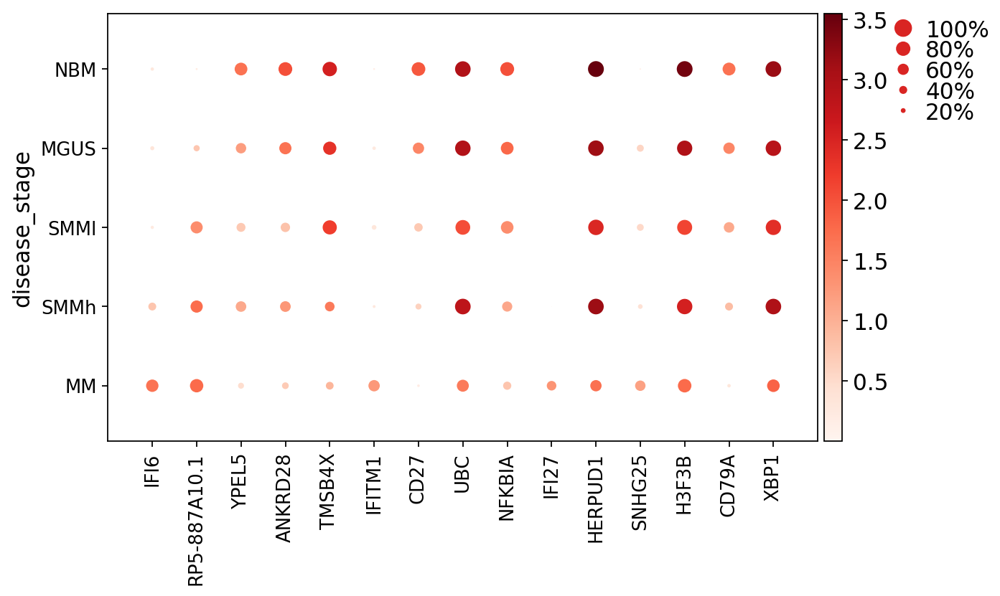

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[8.05, 0, 0.2, 0.5, 0.25])

In [37]:
sc.pl.dotplot(cd138_adata, signif_genes, groupby="disease_stage", figsize=[9,5], save = "_spearman_genes")